# Treasure Hunt Game Notebook

## Read and Review Your Starter Code
The theme of this project is a popular treasure hunt game in which the player needs to find the treasure before the pirate does. While you will not be developing the entire game, you will write the part of the game that represents the intelligent agent, which is a pirate in this case. The pirate will try to find the optimal path to the treasure using deep Q-learning. 

You have been provided with two Python classes and this notebook to help you with this assignment. The first class, TreasureMaze.py, represents the environment, which includes a maze object defined as a matrix. The second class, GameExperience.py, stores the episodes – that is, all the states that come in between the initial state and the terminal state. This is later used by the agent for learning by experience, called "exploration". This notebook shows how to play a game. Your task is to complete the deep Q-learning implementation for which a skeleton implementation has been provided. The code blocs you will need to complete has #TODO as a header.

First, read and review the next few code and instruction blocks to understand the code that you have been given.

In [41]:
from __future__ import print_function
import os, sys, time, datetime, json, random
import numpy as np
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.optimizers import SGD , Adam, RMSprop
from keras.layers.advanced_activations import PReLU
import matplotlib.pyplot as plt
from TreasureMaze import TreasureMaze
from GameExperience import GameExperience
%matplotlib inline

The following code block contains an 8x8 matrix that will be used as a maze object:

In [42]:
maze = np.array([
    [ 1.,  0.,  1.,  1.,  1.,  1.,  1.,  1.],
    [ 1.,  0.,  1.,  1.,  1.,  0.,  1.,  1.],
    [ 1.,  1.,  1.,  1.,  0.,  1.,  0.,  1.],
    [ 1.,  1.,  1.,  0.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  0.,  1.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  1.,  0.,  1.,  0.,  0.,  0.],
    [ 1.,  1.,  1.,  0.,  1.,  1.,  1.,  1.],
    [ 1.,  1.,  1.,  1.,  0.,  1.,  1.,  1.]
])

This helper function allows a visual representation of the maze object:

In [43]:
def show(qmaze):
    plt.grid('on')
    nrows, ncols = qmaze.maze.shape
    ax = plt.gca()
    ax.set_xticks(np.arange(0.5, nrows, 1))
    ax.set_yticks(np.arange(0.5, ncols, 1))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    canvas = np.copy(qmaze.maze)
    for row,col in qmaze.visited:
        canvas[row,col] = 0.6
    pirate_row, pirate_col, _ = qmaze.state
    canvas[pirate_row, pirate_col] = 0.3   # pirate cell
    canvas[nrows-1, ncols-1] = 0.9 # treasure cell
    img = plt.imshow(canvas, interpolation='none', cmap='gray')
    return img

The pirate agent can move in four directions: left, right, up, and down. 

While the agent primarily learns by experience through exploitation, often, the agent can choose to explore the environment to find previously undiscovered paths. This is called "exploration" and is defined by epsilon. This value is typically a lower value such as 0.1, which means for every ten attempts, the agent will attempt to learn by experience nine times and will randomly explore a new path one time. You are encouraged to try various values for the exploration factor and see how the algorithm performs.

In [44]:
LEFT = 0
UP = 1
RIGHT = 2
DOWN = 3


# Exploration factor
epsilon = 0.1

# Actions dictionary
actions_dict = {
    LEFT: 'left',
    UP: 'up',
    RIGHT: 'right',
    DOWN: 'down',
}

num_actions = len(actions_dict)


The sample code block and output below show creating a maze object and performing one action (DOWN), which returns the reward. The resulting updated environment is visualized.

reward= -0.04


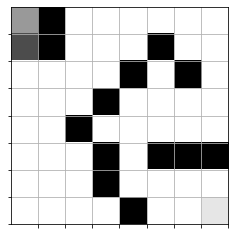

In [45]:
qmaze = TreasureMaze(maze)
canvas, reward, game_over = qmaze.act(DOWN)
print("reward=", reward)
show(qmaze)

This function simulates a full game based on the provided trained model. The other parameters include the TreasureMaze object and the starting position of the pirate.

In [46]:
def play_game(model, qmaze, pirate_cell):
    qmaze.reset(pirate_cell)
    envstate = qmaze.observe()
    while True:
        prev_envstate = envstate
        # get next action
        q = model.predict(prev_envstate)
        action = np.argmax(q[0])

        # apply action, get rewards and new state
        envstate, reward, game_status = qmaze.act(action)
        if game_status == 'win':
            return True
        elif game_status == 'lose':
            return False

This function helps you to determine whether the pirate can win any game at all. If your maze is not well designed, the pirate may not win any game at all. In this case, your training would not yield any result. The provided maze in this notebook ensures that there is a path to win and you can run this method to check.

In [47]:
def completion_check(model, qmaze):
    for cell in qmaze.free_cells:
        if not qmaze.valid_actions(cell):
            return False
        if not play_game(model, qmaze, cell):
            return False
    return True

The code you have been given in this block will build the neural network model. Review the code and note the number of layers, as well as the activation, optimizer, and loss functions that are used to train the model.

In [48]:
def build_model(maze):
    model = Sequential()
    model.add(Dense(maze.size, input_shape=(maze.size,)))
    model.add(PReLU())
    model.add(Dense(maze.size))
    model.add(PReLU())
    model.add(Dense(num_actions))
    model.compile(optimizer='adam', loss='mse')
    return model

# #TODO: Complete the Q-Training Algorithm Code Block

This is your deep Q-learning implementation. The goal of your deep Q-learning implementation is to find the best possible navigation sequence that results in reaching the treasure cell while maximizing the reward. In your implementation, you need to determine the optimal number of epochs to achieve a 100% win rate.

You will need to complete the section starting with #pseudocode. The pseudocode has been included for you.

In [1]:
def qtrain(model, maze, **opt):

    # exploration factor
    global epsilon 

    # number of epochs
    n_epoch = opt.get('n_epoch', 15000)

    # maximum memory to store episodes
    max_memory = opt.get('max_memory', 1000)

    # maximum data size for training
    data_size = opt.get('data_size', 50)

    # start time
    start_time = datetime.datetime.now()

    # Construct environment/game from numpy array: maze (see above)
    qmaze = TreasureMaze(maze)

    # Initialize experience replay object
    experience = GameExperience(model, max_memory=max_memory)
    
    win_history = []   # history of win/lose game
    hsize = qmaze.maze.size//2   # history window size
    win_rate = 0.0
    
    #for each training epoch
    for epoch in range(n_epoch):
        #select a random free cell
        Agent_cell = random.choice(qmaze.free_cells)
        #reset the cell
        qmaze.reset(Agent_cell)
        #set up environmental parameters
        envstate = qmaze.observe()
        game_over = False
        loss = 0
        n_episodes = 0
        #while playing the game (i.e. not over)
        while not game_over:

            prev_envstate = envstate
            q_matrix = model.predict(prev_envstate)
            #randomly chose an action
            action = np.argmax(q_matrix[0])
            envstate, reward, game_status = qmaze.act(action)
            if game_status == 'win':
                win_history.append(1)
                game_over = True
            elif game_status == 'lose':
                win_history.append(0)
                game_over = True
            else:
                 game_over = False

            #train the network by calling experience
            maze_run = [prev_envstate, action, reward, envstate, game_over]
            experience.remember(maze_run)
            n_episodes += 1
            inputs,targets = experience.get_data()
            #examine history and loss
            history = model.fit(inputs, targets, epochs=10, verbose=1)
            loss = model.evaluate(inputs, targets)

        win_rate = sum(win_history) / len(win_history)
    

    #Print the epoch, loss, episodes, win count, and win rate for each epoch
        dt = datetime.datetime.now() - start_time
        t = format_time(dt.total_seconds())
        template = "Epoch: {:03d}/{:d} | Loss: {:.4f} | Episodes: {:d} | Win count: {:d} | Win rate: {:.3f} | time: {}"
        print(template.format(epoch, n_epoch-1, loss, n_episodes, sum(win_history), win_rate, t))
        # We simply check if training has exhausted all free cells and if in all
        # cases the agent won.
        if win_rate > 0.9 : epsilon = 0.05
        if sum(win_history[-hsize:]) == hsize and completion_check(model, qmaze):
            print("Reached 100%% win rate at epoch: %d" % (epoch,))
            break
    
    
    # Determine the total time for training
    dt = datetime.datetime.now() - start_time
    seconds = dt.total_seconds()
    t = format_time(seconds)

    print("n_epoch: %d, max_mem: %d, data: %d, time: %s" % (epoch, max_memory, data_size, t))
    return seconds

# This is a small utility for printing readable time strings:
def format_time(seconds):
    if seconds < 400:
        s = float(seconds)
        return "%.1f seconds" % (s,)
    elif seconds < 4000:
        m = seconds / 60.0
        return "%.2f minutes" % (m,)
    else:
        h = seconds / 3600.0
        return "%.2f hours" % (h,)

## Test Your Model

Now we will start testing the deep Q-learning implementation. To begin, select **Cell**, then **Run All** from the menu bar. This will run your notebook. As it runs, you should see output begin to appear beneath the next few cells. The code below creates an instance of TreasureMaze.

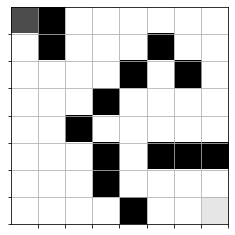

In [50]:
qmaze = TreasureMaze(maze)
show(qmaze)

In the next code block, you will build your model and train it using deep Q-learning. Note: This step takes several minutes to fully run.

In [51]:
model = build_model(maze)
qtrain(model, maze, epochs=1000, max_memory=8*maze.size, data_size=32)

Epoch 1/10
1/1 [==============================] - 1s 506ms/step - loss: 0.0206
Epoch 2/10
1/1 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 3/10
1/1 [==============================] - 0s 7ms/step - loss: 0.0077
Epoch 4/10
1/1 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 5/10
1/1 [==============================] - 0s 3ms/step - loss: 0.0045
Epoch 6/10
1/1 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 7/10
1/1 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 8/10
1/1 [==============================] - 0s 2ms/step - loss: 0.0043
Epoch 9/10
1/1 [==============================] - 0s 2ms/step - loss: 0.0035
Epoch 10/10
1/1 [==============================] - 0s 60ms/step
Epoch 1/10
2/2 [==============================] - 0s 1ms/step - loss: 0.0188
Epoch 2/10
2/2 [==============================] - 0s 1ms/step - loss: 0.0071
Epoch 3/10
2/2 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 4/10

Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 10/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0030
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 216us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202u

Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 305us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 6/10
10/10 [========================

10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - 

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.9736e-04
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 8.1364e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 7.5963e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 296us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 6/10
10/10 [=============

Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 5.5796e-04
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 193us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch: 000/14999 | Loss: 0.0014 | Episodes: 144 | Win

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 7.5929e-04
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 7.8613e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 9.0333e-04
Epoch 4/10
10/10 [============

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 8.7220e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 8.6700e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 9.0265e-04
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 7.7517e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 8.0665e-04
Epoch 9/10
10/10 [=====

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 8.0882e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.2476
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.2479
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.2417
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.2386
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0148
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0151
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0185
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0130
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0152
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0154
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 201us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 200us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 306us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 201us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 295us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 301us/step - l

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0080
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0081
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0077
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0400
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0384
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0390
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0393
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0382
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0383
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0385
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0374
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0363
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 199us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0021
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0871
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0799
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0861
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0755
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0812
Epoch 6/10
10/10 [==============================] - 0s 296us/step - loss: 0.0724
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0749
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0676
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0674
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0095
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0149
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 204us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0183
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0219
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0154
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0189
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0179
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0145
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0168
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0151
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0164
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 196us/step - 

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 6/10
10/10 [===========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0083
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0083
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0079
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0073
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 296us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0067
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0067
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 197

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 194us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 3

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0024
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 400us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.1070
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0977
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0947
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0951
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0967
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0953
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0956
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0931
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0905
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 199us

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch: 003/14999 | Loss: 0.0021 | Episodes: 136 | Win count: 1 | Win rate: 0.250 | time: 23.0 seconds
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 6/10
10/10 [===

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0116
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0114
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0113
Epoch 8/10
10/10 [==============================] - 0s 296us/step - loss: 0.0109
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0109
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1267
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0078
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0112
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0108
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0108
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0105
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0105
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0103
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 194us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 204

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0081
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0083
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0080
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0073
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0078
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0070
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0055
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0036
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 401us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 503us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 301us/step - 

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 305us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 2

10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 004/14999 | Loss: 0.0021 | Episodes: 142 | Win count: 1 | Win rate: 0.200 | time: 30.0 seconds
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/10
10/10 [================

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0238
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0274
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0084
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0186
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0089
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.1232
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1268
Epoch 6/10
10/10 [==============================] - 0s 307us/step - loss: 0.1272
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1249
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1241
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.1200
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.1390
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0076
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0078
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0082
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 8.9417e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 9.1216e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 7.9049e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.2356e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 8.4059e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 9.6817e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 6.9980e-04
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 9.6897e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 5.9968e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 8.7229e-04
Epo

Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 307us/step - loss: 0.0089
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0088
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0088
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0085
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0082
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0082
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 305us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 4/10
10/10 [===========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 296us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/10
10/10 [==========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 9.3652e-04
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 9.0692e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 9.5559e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.8459e-04
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 9.4434e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 8.7663e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 9.2084e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 8.5392e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [====================

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 9.3989e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 8.9819e-04
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 8.6187e-04
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 9.6086e-04
Epoch 7/10
10/10 [========

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 296us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 305us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1603
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.1483
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.1578
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.1469
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1421
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1273
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1405
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.1302
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.1320
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.1313
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1298
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1273
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.1270
Epoch 10/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 2.2546e-04
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 3/10
10/10 [====================

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 29

Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0016
Epoch 10/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 4/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 7.8639e-04
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 7.6017e-04
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 7.6042e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 7.6182e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 9.9341e-04
Epoch 8/10
10/10 [=====

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0187
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0246
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0198
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0170
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0238
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0149
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0202
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0159
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0171
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 2/10
10/10 [==============================] - 0s 201u

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.1472
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.1465
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1429
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1442
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.1426
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 98us/step - loss: 0.0061
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0068
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0071
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0066
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 300us/step - l

Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 274us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 208us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 226us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 190us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 498us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 196us/step - l

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 9.5389e-04
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 9.3405e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 9.3476e-04
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 9.5735e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 9.4617e-04
Epoch 7/10
10/10 [=====

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 9.8392e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.6902e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 6/10
10/10 [======================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 207us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 10/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 4.4251e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 3.5769e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 4.4234e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 3.9469e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 3.6839e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 3.9302e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 3.5902e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/

Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1528
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1421
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1436
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1433
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.1441
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1417
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.1396
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1401
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1359
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 295us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0079
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0070
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 208us/step - loss: 0.0108
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0117
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0106
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0110
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0109
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0066
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0067
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 97us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 100us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 194us/step - loss: 0.0038
Epoch 8/10
10/10 [===========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0564
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0048
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 1

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.1205
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.1120
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1142
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1118
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.1102
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1098
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 1

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 201u

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0232
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0171
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0228
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0175
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0175
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 30

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0015
Epoch 7/10
10/10 [===========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 199u

Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 8.6123e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.3869e-04
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 8.9876e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 8.7257e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 8.3092e-04
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 8.8847e-04
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 8.7536e-04
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 8.2080e-04
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 8.3101e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 2/10
10/10 [===

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 404us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0083
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 204us/step - los

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 395us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 306us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1928
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.1529
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1288
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0861
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0883
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0591
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0483
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0713
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0520
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 199us/step - los

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0115
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0095
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1840
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.1731
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.1740
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.1691
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1660
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1611
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1620
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 302us/step - l

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0750
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0745
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0694
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0731
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0682
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0708
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0678
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0698
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0670
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 203

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 010/14999 | Loss: 0.0014 | Episodes: 135 | Win count: 2 | Win rate: 0.182 | time: 63.5 seconds
Epoch 1/10
10/10 [====================

10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0

Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0855
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0819
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0798
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0824
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0798
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0791
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0783
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0804
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0767
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0240
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0235
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0238
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0233
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0235
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0229
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0770
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 306us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201u

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 6.7043e-04
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 7.8601e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 9.2936e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 7.8985e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [=========

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0179
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0139
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0117
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0117
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0108
Epoch 9/10
10/10 [==============================] - 0s 307us/step - loss: 0.0095
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0022
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0140
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0130
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0127
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0125
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [===========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.1465
Epoch 2/10
10/10 [==============================] - 0s 204us/step - l

Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0069
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.1400
Epoch 2/10
10/10 [==============================] - 0s 205us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 199

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 9.0788e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.1428
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.1367
Epoch 3/10
10/10 [==============================] - 0s 296us/step - loss: 0.1313
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1345
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1316
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1325
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1300
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.1288
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1311
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 305us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 8.5004e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 7.9375e-04
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 7.2056e-04
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 7.8468e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 8.3729e-04
Epoch 6/10
10/10 [======

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1594
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1479
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.1486
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.1480
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1471
Epoch 6/10
10/10 [==============================] - 0s 305us/step - loss: 0.1535
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1452
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.1390
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.1420
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1352
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.1279
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.1254
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1218
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1169
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303u

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 399us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 8.9220e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 10/10
10/10 [===================

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.1106
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1033
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.1019
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0930
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0846
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0815
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0106
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0137
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0111
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0831
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0843
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 306us/step - loss: 0.0029
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 296us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 203us/step - lo

Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.1379
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1337
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.1340
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1311
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1290
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1319
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 202u

Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1497
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.1426
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1429
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.1408
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1433
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 4

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0554
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0462
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0504
Epoch 6/10
10/10 [==============================] - 0s 401us/step - loss: 0.0425
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0449
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0400
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0409
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0123
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0105
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 290us/step - loss: 0.1199
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.1121
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1084
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1097
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.1127
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1092
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1060
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.1038
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1058
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1467
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1431
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1376
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.1346
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0095
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0107
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0120
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0109
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0101
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0113
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0101
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0099
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0089
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0081
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0082
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0081
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0080
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0296
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0246
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0275
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0244
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0252
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0239
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 402us/step - loss: 0.0969
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0994
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0915
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0933
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0879
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0060
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0032
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0127
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0106
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0111
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0097
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0110
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0109
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0082
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0080
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1163
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.1157
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0107
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0100
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0102
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0096
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0098
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0037
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0034
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 202us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 402us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 401us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 3/10
10/10 [==========================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 4.4357e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 5.5810e-04
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 5.1286e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 4.2928e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 5.3364e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 3.8017e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 4.9016e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 2.4594e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.9717e-04
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 3.0690e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 3.2215e-04


Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 9.6623e-04
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 8.7985e-04
Epoch 3/10
10/10 [=================

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0076
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0098
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0032
Epoch 7/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 6.9519e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 295us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 403us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 10/10
10/10 [=======================

Epoch 1/10
10/10 [==============================] - 0s 95us/step - loss: 4.9462e-04
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 5.6221e-04
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 5.1421e-04
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 4.5923e-04
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 5.1129e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.5700e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 4.6674e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 4.0377e-04
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 4.8193e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.2186
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.2002
Epoch 3/1

Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 399us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 199us/step - 

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 8.8300e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 9.1129e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 9.9457e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 9.0956e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 9.1108e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 8.9687e-04
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 8.5587e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.1596e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 2/10
10/10 [===================

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [===========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 6.7409e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 6.7187e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 6.7537e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0696
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0484
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0360
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0289
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0117
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0155
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0144
Epoch 9/10
10/10 [=============

10/10 [==============================] - 0s 301us/step - loss: 0.2272
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.2131
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.2051
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.2076
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.2087
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.2051
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.1993
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1986
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.1987
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0108
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0106
Epoch 3/10
10/10 [==============================] - 0s

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 195us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0059
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0147
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0196
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0145
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0187
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0119
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0173
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0108
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0156
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0107
Epoch 2/10
10/10 [==============================] - 0s 203us/step - los

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0041
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1134
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.1111
Epoch 3/10
10/10 [===========================

Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 10/10
10/10 [==============================] - 0s 199us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0061
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0061
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 4/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 598us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 400us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 9.7858e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 9.9989e-04
Epoch 9/10
10/10 [================

Epoch 1/10
10/10 [==============================] - 0s 400us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.2085
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.2007
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 188us/step - loss: 0.0027
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 299us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 400us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 198us/step - l

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 9.1800e-04
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 9.3249e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 9.9148e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.5883e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 9.0658e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 8.4334e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 8.2519e-04
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 7.7980e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 3.9112e-04
Epoch 2/10
10/10 [===

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 9.0808e-04
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 5.2232e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 7.0525e-04
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 4.9258e-04
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 6.0422e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 5.4662e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 4.8107e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 5.5717e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 4.1226e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 5.1987e-04
Ep

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 9.8143e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 9.4903e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 8.2274e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.8996e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 402us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 4/10
10/10 [========

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 8.8803e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.8731e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 8.1637e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 9.8871e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 8.3912e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 305us/step - loss: 7.8679e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 7.5794e-04
Epoch 9/10
10/10

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0033
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 018/14999 | Loss: 0.0017 | Episodes: 140 | Win count: 3 | Win rate: 0.158 | time: 111.7 seconds
Epoch 1/10
10/10 [=============================

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 9.3386e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 8.6804e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 8.7611e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 8.5134e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 8.4881e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 8.5563e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 6/10
10/10 [

Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 8.2189e-04
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 9.6139e-04
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 9.1602e-04
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 9.5313e-04
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 8.4731e-04
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 8.2149e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 8.9843e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [============

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 6.2325e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 6.1458e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 6.2576e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 5.9114e-04
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 6.4089e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.7747e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 6.0533e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0025
Epoch 5/10
10/

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 5.1404e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 4.5849e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.0042e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 6.4707e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 6.4087e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 6.3094e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 6.2460e-04
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 6.9242e-04
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 5.4252e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 6.1081e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.3004e-04
E

10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 8.7635e-04
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 7.6982e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 8.9285e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.3352e-04
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 9.2476e-04
Epoch 6/10
10/10 [==============================] - 0s 400us/step - loss: 7.0765e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 8.5424e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 6.6818e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 7.3599e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/10
10/10 [===============

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 3.4697e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 3.1090e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 3.0568e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 3.2382e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 3.0824e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 3.0921e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 6/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 3.8606e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 4.1790e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 3.9303e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 3.9377e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 3.4341e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 3.4818e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 3.5732e-04
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 3.4209e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 3.5828e-04
Epoch 

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 301us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/10
10/10 [==========================

10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1844
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1766
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.1771
Epoch 4/10
10/10 [==============================] - 0s 502us/step - loss: 0.1692
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.1704
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1682
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1666
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1686
Epoch 9/10
10/10 [==============================] - 0

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 3/10
10/10 [=========================

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199u

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 398us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 8.0145e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.6120e-04
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.5899e-04
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 9.7149e-04
Epoch 4/10
10/10 [==========

Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 9.1708e-04
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 8.1283e-04
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 8.2075e-04
Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 8.6180e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 8.3214e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 7.9646e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 8.0973e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.9617e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.8371e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/10
10/10 [===================

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 8.1130e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 7.8550e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 7.2765e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 7.6502e-04
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 7.4326e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.4752e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/10
10/10 [==

Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 200us/step
Epoch 1/10
10/10 [==============================] - 0s 1

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.9283e-04
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 9.1339e-04
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 8.7007e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 8.9677e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 8.7046e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 8.7123e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 8.6594e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 8.3989e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/10

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 404us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 9.2589e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 9.8139e-04
Epoch 5/10
10/10 [==================

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 199us/step - 

Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 4.3335e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 7.9246e-04
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 5.5967e-04
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 5.8232e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 6.5698e-04
Epoch 6/10
10/10 [=====

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 8.7402e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 6.0707e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 7.8618e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 9.8648e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.8239e-04
Epoch 9/10
10/10 [=======

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 5.9395e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 5.6994e-04
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 5.9898e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 6.1532e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 6.3227e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 6.0073e-04
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 5.7572e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 5.5154e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.5125e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 2/10
10/10 [===

Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 9.2083e-04
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 8.1033e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 8.2815e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 8.6596e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 8.5156e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 7.8896e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.1101e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 8.2750e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 4/10

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0122
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0170
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0154
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0121
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0175
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0185
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0209
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0137
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0213
Epoch 6/10
10/10 [==============================] - 0s 500us/step - loss: 0.0158
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0155
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 9.8302e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.9408e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.9519e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 95us/step - loss: 0.0024
Epoch 3/10
10/10 [=============

Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 201us/step - los

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 296us/step - loss: 0.0023
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 203us/step - los

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 7/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 7.0829e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 5.6741e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 6.2998e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 6.0421e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 5.6273e-04
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 6.1744e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 5.2864e-04
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 6.0076e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 5.4677e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.6365e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.2216
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.2205
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.2243
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.2219
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.2160
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.2182
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.2157
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 021/14999 | Loss: 0.2114 | Episodes: 136 | Win count: 3 | Win rate: 0.136 | time: 131.5 seconds
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0204
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0174
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0205
Epoch 4/10
10/10 [====

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0335
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0329
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0327
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0327
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0327
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0325
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.3000
Epoch 2/10
10/10 [==============================] - 0s 701us/step - loss: 0.2015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1528
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.1654
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0971
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0991
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0412
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1157
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0304
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0153
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0152
Epoch 6/10
10/10 [==============================] - 0s 403us/step - loss: 0.0151
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0153
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0124
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0149
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0144
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0136
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0124
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0137
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0123
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0127
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0070
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0059
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.2076
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.1899
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.1867
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.1888
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1746
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1610
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0095
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0095
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0085
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0077
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0076
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0083
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 303

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 296us/step - loss: 0.0047
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0090
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0070
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0320
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0317
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0313
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0310
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0308
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0302
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0099
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0089
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0087
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0091
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0078
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0088
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 204

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 305us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 401us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 2/10
10/10 [==============================] - 0s 30

Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 6.9988e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 6.8170e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 7.3020e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 7.6753e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 7.3766e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 107us/step - loss: 0.0030
Epoch 7/10
10/10 [====

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201u

Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 399us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 10/10
10/10 [=======================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 296us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1795
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1702
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1753
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0091
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0280
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0238
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0098
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0203
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0102
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0172
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1438
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0126
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0116
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0127
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0090
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0127
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0112
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0104
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0108
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0092
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 300

Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0028
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 502us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0108
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0113
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0099
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0103
Epoch 2/10
10/10 [==============================] - 0s 10

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0401
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0360
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0377
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0341
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0350
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0329
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0333
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0302
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0304
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 197us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0392
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0332
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0364
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0297
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0136
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0120
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0086
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0095
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0095
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0095
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0088
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0090
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0091
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0087
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0088
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 025/14999 | Loss: 0.0089 | Episodes: 144 | Win count: 5 | Win rate: 0.192 | time: 145.3 seconds
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0055
Epoch 2/10
10/10 [====

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1318
Epoch 2/10
10/10 [==============================] - 0s 197u

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 5.9931e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 6.5133e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 5.9885e-04
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 6.3169e-04
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 5.8648e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0882
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0918
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0806
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0888
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0753
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0847
Epoch 7/10
10/10 [=====

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0150
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0160
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0128
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0146
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0121
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0141
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0118
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0129
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0112
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 303

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 403us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 105us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0154
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0136
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0149
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0148
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0113
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0090
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0085
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 204us/step - 

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 800us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 402us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0396
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0358
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0351
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0315
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0290
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0280
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0249
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0231
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0216
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0144
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0140
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0138
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0121
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0122
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0099
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0086
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 29

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 306us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 8.4058e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 7.4723e-04
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 7.4274e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 7.6244e-04
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 8.1003e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 7.9029e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 7.2322e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 6.9310e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0022
Epoch 4/10
1

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0090
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0081
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0083
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0075
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0078
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 8.2623e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 8.0378e-04
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 7.8996e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0065
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 9/10
10/10 [===============

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0165
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0154
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0117
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0355
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0098
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0316
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0248
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0100
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0211
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0104
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0160
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0536
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0213
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0388
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0300
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0284
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0308
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0220
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0349
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0494
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0503
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0456
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 3.6233e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.5536e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 5.0973e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 3.7309e-04
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 3.5644e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 7/10
10/10 [====

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 7.0135e-04
Epoch 2/10
10/10 [==============================] - 

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0120
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0128
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0104
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0142
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0100
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0122
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0082
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0101
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 306us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0120
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0091
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 10/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 9.7927e-04
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 9.6587e-04
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 9.5183e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 9.7315e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 9.4823e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 4.9888e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 5.3139e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 5.1855e-04
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 5.0340e-04
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 4.9696e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 7/10
10/10 [====

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 401us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 202us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 405us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 6.9527e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.1442e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 190us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 10/10
10/10 [================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 295us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.2114
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.2006
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 9.1129e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 7.5619e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 9.8056e-04
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 7.7419e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 7.7766e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 7.9405e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 7.5468e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 8.1692e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 6.9407e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 2/10
10/10 [==

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 9.8066e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 7.5929e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 7.6482e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 8.5385e-04
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 8.4783e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.6776e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/10
10/10 [==

Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 9.0589e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.0802e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 8.8790e-04
Epoch 4/10
10/10 [============

Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch: 028/14999 | Loss: 0.0016 | Episodes: 134 | Win count: 5 | Win rate: 0.172 | time: 163.9 seconds
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/10
10/10 [==

Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0163
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0140
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0161
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0131
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0146
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 295us/step - loss: 0.0086
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0073
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0085
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0066
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 7.4741e-04
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 6.8639e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 7.0681e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.6151e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 7.4225e-04
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 6.9900e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 9.3000e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.4267e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 8.8800e-04
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 8.3309e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 8.0692e-04


Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0147
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0111
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 194us/step - loss: 0.0089
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0084
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0087
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0083
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0080
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0078
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0076
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0335
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0258
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0330
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0240
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0307
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0256
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0268
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0097
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0154
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0149
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0085
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 7.3965e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 7.8031e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 7.4739e-04
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 6.8032e-04
Epoch 5/10
10/10 [========

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 296us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 296us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 405us/step - loss: 8.2026e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 6.6971e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 7.5839e-04
Epoch 4/10
10/10 [=============

10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 601us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 104us/step - 

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.2013
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.1938
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1915
Epoch 4/10
10/10 [==============================] - 0s 296us/step - loss: 0.1829
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1816
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.1823
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1470
Epoch 2/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 403us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 401us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 8.6814e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 9.6800e-04
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 8.5381e-04
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 8.8244e-04
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 9.5781e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [=====================

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 7.9052e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 8.0962e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 7.8880e-04
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 8.6220e-04
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 6.5553e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 5/10
10/10 [====

Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0093
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0121
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0104
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0112
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0113
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0104
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0108
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0099
Epoch 10/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0086
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0085
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 9.9831e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/10
10/10 [====================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.2025
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 204us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 6.0954e-04
Epoch 2/10
10/10 [==============================] - 

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1924
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1842
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1838
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.1828
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1807
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1828
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.1807
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0134
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0121
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.1417e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 8.4693e-04
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 6.3547e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 6.6402e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 6.6731e-04
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 7.2352e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 6.5148e-04
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 7.4869e-04
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 6.3405e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 6.7789e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 6.5221e-04

Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 8.3517e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [====================

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 4.4562e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.9731e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 4.2591e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 6.8172e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch: 030/14999 | Loss: 0.0005 | Episodes: 139 | Win count: 5 | Win rate: 0.161 | time: 177.7 seconds
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 5.7412e-04
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 9.8076e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 7.0104e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.2189e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 8.0576e-04
Epoch 6/10
10/10 [==============================] - 0s 101us/step

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0107
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0088
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0086
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0076
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0084
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 6.9179e-04
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 6.7527e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 6.6083e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 4.9588e-04
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 5.0271e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 5.9845e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 5.3717e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.1915e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.2767e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 7.3791e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 1.4757e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 1.4216e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 1.3813e-04
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 1.3498e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 1.3466e-04
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 1.2597e-04
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 1.2446e-04
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 1.2183e-04

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 8.2529e-04
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 9.3544e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 9.4238e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 7.7246e-04
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 9.7482e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.5232e-04
Epoch 9/10
10/10 [==============================] - 0s 402us/step - loss: 9.1695e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 2/10
10/10 [==========

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 7.2711e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 6.9430e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 7.0412e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/10
10/10 [============

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 3.9953e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.8036e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 3.5629e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 3.4418e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 3.4145e-04
Epoch 6/10
10/10 [==============================] - 0s 305us/step - loss: 3.5042e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 3.5333e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 3.4656e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 3.3167e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 399us/step - loss: 6.3487e-04
Epoch 2/10
10/10 [===========

Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 6/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 9.7482e-04
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 8.3588e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 8.0097e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 8.5450e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 7.3016e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 7.8516e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 7.1264e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.9415e-04
Epoch 9/10

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 9.4201e-04
Epoch 2/10
10/10 [==============================] - 0s 399us/step - loss: 8.8807e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 8.8763e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 9.0289e-04
Epoch 5/10
10/10 [==============================] - 0s 398us/step - loss: 8.7286e-04
Epoch 6/10
10/10 [=====

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1996
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1944
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 0.0359
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0365
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0335
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0226
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0329
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0251
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0302
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0223
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0280
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 9.9690e-04
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 9.6480e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 5/10
10/10 [================

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 7.0991e-04
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 6.8407e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 7.2352e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 6.9720e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/10
10/10 [=========

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 296us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 10

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 9.1458e-04
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 7.5856e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 9.1289e-04
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 7.6386e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 4.3215e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.7508e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 3.6693e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 3.1366e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 3.2953e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 3.0347e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 3.3267e-04

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 5.3620e-04
Epoch 2/10
10/10 [==============================] - 0s 

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 9.7856e-04
Epoch 2/10
10/10 [==============================] - 0s 305us/step - loss: 0.0013
Epoch 3/10
10/10 [=====================

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 9.7068e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.8250e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 9.5747e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 9.4420e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 3.5969e-04
Epoch 2/10
10/10 [===================

10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 305us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.1725
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.1702
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1714
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1618
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1649
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.1618
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 8.3704e-04
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 8.0028e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 7.2687e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.5594e-04
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 7.6207e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 7.3773e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 6.9497e-04
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 6.3830e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 6.4200e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [===

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0034
Epoch 5/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0114
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0107
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0096
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0114
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0097
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0118
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0188
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0137
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.8115e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 9.6364e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 9.8796e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 9.0366e-04
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 9.4513e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 9.9842e-04
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 9.9763e-04
Epoch 7/10
10/

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 6.7402e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1497
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1591
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1552
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1512
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1475
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.1461
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.1496
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0112
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0121
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0116
Epoch 4/10
10/10 [==============================] - 0s 295us/step - loss: 0.0103
Epoch 5/10
10/10 [========================

10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 6.3699e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 8.1084e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 7.2381e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.2707e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 6.3135e-04
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 8.9000e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/10
10/10 [==

Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0108
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0105
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0083
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 400us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 10/10
10/10 [=======================

10/10 [==============================] - 0s 203us/step - loss: 7.2133e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 7.2856e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 6.6668e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 6.9337e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 6.2442e-04
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 6.7297e-04
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 6.2860e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 6.6857e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 6.3675e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 3/10
10/10 [

Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1480
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1425
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1459
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1386
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1405
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.1353
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1379
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.1346
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.1361
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0229
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 8.6257e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 8.2878e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 8.6706e-04
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 8.6000e-04
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 8.7856e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [====

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0060
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 9.8407e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 8.7505e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 9.9000e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 8.4711e-04
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 9.4539e-04
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 8.0349e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 9.0498e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 8.2115e-04
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 9.5657e-04
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 7.6475e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 8.2894e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 8.0325e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 7.8358e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 8.0208e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 6.8407e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.4007e-04
Epoch 1

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0338
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0528
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0478
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0310
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0493
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0258
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0389
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0358
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0283
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0092
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0074
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0040
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 3/10
10/10 [=========================

10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 193us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 8.0707e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 9.0094e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 8.1124e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 7.3172e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 8.4101e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 7.2388e-04
Epoch 8/10
10/10 [=

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 199us/step - los

Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 5.8583e-04
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 8.4450e-04
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 7.8040e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 5.9539e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.4980e-04
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 5.4313e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.1695e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 6.3641e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 5.6083e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 2/10
10/10 [===

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 194us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 8.0097e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 8.0597e-04
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 8.1519e-04
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 7.9153e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 7.9101e-04
Epoch 6/10
10/10 [=====

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 5/10
10/10 [==========================

10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 9.8541e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 9.9924e-04
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 9.9734e-04
Epoch 10/10
10/10 [=============

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 4/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 6.5025e-04
Epoch 7/10
10/10 [==============================] - 0s 194us/step - loss: 6.8340e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 7.2641e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 6.3251e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 8/10
10/10 [=========

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.1209
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1171
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.1186
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1121
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.1120
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.1116
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.1095
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1121
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.1103
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0256
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1194
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1142
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.1151
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1100
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1094
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.1113
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1096
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.1125
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1117
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0182
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 199us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - 

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0978
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0311
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0263
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0267
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0225
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0231
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0246
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0237
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0261
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0248
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 207us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0021
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0063
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 9.8985e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 297us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1109
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.1083
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1070
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.1051
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1036
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 29

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0094
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0085
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0096
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0082
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 7.3065e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.5115e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 10/10
10/10 [===============

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 296us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/10
10/10 [=========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 299

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 4.9873e-04
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 4.7292e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 4.8854e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 4.9528e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 4.9080e-04
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 4.8945e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 4.6242e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 4.5996e-04
Epoch 9/10

Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 305us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 192us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0026
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 8.0857e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 9.2049e-04
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 7.8428e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.8471e-04
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 7.3294e-04
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 7.1103e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.0161e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 7.0495e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 6.7756e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 195us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 296us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - 

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 5.0907e-04
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 5.1320e-04
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 5.2092e-04
Epoch 4/10
10/10 [==============================] - 0s

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0106
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0118
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0102
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0116
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0094
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0072
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0062
Epoch 10/10
10/10 [=======================

10/10 [==============================] - 0s 397us/step - loss: 0.0101
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0073
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0081
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0077
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s

Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 300us/step
Epoch: 038/14999 | Loss: 0.0011 | Episodes: 144 | Win count: 6 | Win rate: 0.154 | time: 225.7 seconds
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/10
10/10 [==

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.4074
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.3829
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.3840
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.3657
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.3754
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.3761
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.3740
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.3699
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.3533
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0094
Epoch 2/10
10/10 [==============================] - 0s 300us/step - los

Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1868
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.1805
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1779
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1731
Epoch 5/10
10/10 [==============================] - 0s 296us/step - loss: 0.1776
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1762
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1450
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.1409
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.1388
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1352
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.1341
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.1354
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1349
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.1358
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1359
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 298

Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0086
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0088
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0083
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0080
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1148
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0876
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0843
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0838
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0820
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0801
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0808
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0805
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0798
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0793
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0104
Epoch 2/10
10/10 [==============================] - 0s 302us/step - 

Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 204us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0119
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0088
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0107
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0108
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0126
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0107
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0110
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0097
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0100
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0082
Epoch 2/10
10/10 [==============================] - 0s 200us/step - los

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0041
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 7.0604e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 201us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 29

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 7/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0078
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 8.2176e-04
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 7.7284e-04
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 9.5945e-04
Epoch 5/10
10/10 [==============

Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.1211
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.1192
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.1178
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.1169
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.1173
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1157
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1150
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1181
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.1241
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1041
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1121
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0124
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0083
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0029
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.2998e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 401us/step - loss: 9.1783e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 9.4750e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 9.4845e-04
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 9.0903e-04
Epoch 9/10
10/10 [====

Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 3/10
10/10 [===========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.9961e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 8.4686e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 4.1801e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 7.1321e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [=========

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 8.0055e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 9.1641e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 9.6544e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 9.2992e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 8.4456e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 9.3680e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 5/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 9.7878e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 105us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 10/10
10/10 [===================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0116
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0122
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0100
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0111
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0108
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0102
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0106
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.2275
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.2106
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.2333
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 9.0285e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 9/10
10/10 [=====================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0088
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0076
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0074
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0143
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0164
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0146
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0106
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0102
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0103
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0093
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0054
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0022
Epoch 9/10
10/10 [========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 306us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 100us/step - 

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 296us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0102
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 104us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 7.6101e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 6.3891e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 7.4016e-04
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 6.4654e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 7.0019e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0073
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0066
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0063
Epoch 7/10
10/10 [=====

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203

Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1893
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.1820
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0076
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0090
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 305us/step - loss: 0.0102
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 10/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 9/10
10/10 [=========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0242
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0240
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0190
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0205
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0187
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0212
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0190
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0200
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0176
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0127
Epoch 2/10
10/10 [==============================] - 0s 300us/step - 

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0021
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 10/10
10/10 [========================

10/10 [==============================] - 0s 202us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 7.9848e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 8.4738e-04
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 8.8476e-04
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 9.1686e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 7.5907e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.1583
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.1550
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.1556
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1570
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1503
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1471
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0042
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0217
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0208
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0181
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0161
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0157
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0165
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0167
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0162
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0145
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0742
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0698
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0672
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0606
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0583
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0061
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0240
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0361
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0291
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0182
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0221
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0261
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0196
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0141
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0190
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0088
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0058
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0117
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0100
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0069
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0111
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0112
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 305us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0185
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0185
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 403us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0076
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0065
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0198
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0200
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0199
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0192
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0187
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0189
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us

Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0081
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 799us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0076
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0104
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0080
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0088
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0074
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 19

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0070
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 8.9725e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0068
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 10/10
10/10 [=====================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0179
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0161
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0217
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0150
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0154
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0181
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0116
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0187
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0158
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0112
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 8.6479e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 7.4077e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 6.8702e-04
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 7.3003e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 7.1625e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 6.5066e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 6.2439e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 6.6413e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 5.9734e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 6.2142e-04
Epo

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1126
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0980
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1027
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1032
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0936
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1008
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0933
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0904
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0155
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0169
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0188
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0237
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0203
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0183
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 8.5895e-04
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0066
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 9/10
10/10 [====================

Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0109
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0123
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0117
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0108
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0135
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0286
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0187
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0153
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0245
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0128
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0173
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0187
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0107
Epoch 10/10
10/10 [==============================] - 0s 94us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0089
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0230
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0160
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0159
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0153
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0156
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0146
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0146
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0145
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0132
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0212
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0240
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0197
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0192
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0192
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0156
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0157
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0141
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0090
Epoch 4/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0153
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0141
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0137
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0139
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0093
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0093
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0091
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0082
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0080
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - los

Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0075
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0072
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 401us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - los

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 306us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 4.1300e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 4.3202e-04
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 4.1331e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 4.0369e-04
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 3.8505e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 3.7302e-04
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 3.9030e-04
Epoch 8/10
10/

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0145
Epoch 2/10
10/10 [==============================] - 0s 301us/step - 

Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 204us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 98us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0093
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0084
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0108
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0092
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0093
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0104
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0089
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0098
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0099
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0100
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0090
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0092
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0089
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0088
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0085
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0084
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 3.7698e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 4.7835e-04
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 4.9611e-04
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 3.3539e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 4.7081e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 4.0133e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 4.1087e-04
Epoch 10/10
10/10 [==============================] - 0s 202us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0045
Epoch 5/10
10/

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0660
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0726
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0629
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0640
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0671
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0579
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0617
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0110
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0109
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0102
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0100
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0102
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0099
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0098
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202us/step - 

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 6.5807e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 6.8396e-04
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 6.2245e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 5.0794e-04
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 5.7471e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 5.1800e-04
Epoch 7/10
10/10 [

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0150
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 7.8480e-04
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 8.5229e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 8.3822e-04
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 6.9181e-04
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 7.1330e-04
Epoch 6/10
10/10 [====

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 3.8075e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 2.6283e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 10/10
10/10 [===============

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0657
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0749
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0666
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0628
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0632
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0596
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0348
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0326
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0340
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0330
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0324
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0307
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0297
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0409
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0218
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0268
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0229
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0149
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 204us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0154
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0151
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0122
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0116
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0035
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0095
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0093
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0101
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0086
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0081
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0022
Epoch 4/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0295
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0300
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0294
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0269
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0280
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0272
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0252
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0055
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0140
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0159
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0138
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0153
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0137
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0450
Epoch 2/10
10/10 [==============================] - 0s 200u

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0119
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0105
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0103
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0108
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0102
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0099
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0100
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0097
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 302us/step - los

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0044
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 7.1096e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.8709e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 5.8554e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 7.4602e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0179
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0188
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0168
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0177
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0165
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0161
Epoch 7/10
10/10 [========

Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 8.0480e-04
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0865
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0825
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0783
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0797
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0805
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0800
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0785
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0761
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0759
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 207us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 5.6643e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 4.0723e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 5.1714e-04
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 4.1887e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 4.5660e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.2242e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 4.0380e-04
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 4.2250e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 3.6168e-04
Epoch 1

Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0086
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0395
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0167
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0117
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0372
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0174
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0239
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0224
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0137
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0219
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0093
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0056
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 9.9877e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 8.7101e-04
Epoch 9/10
10/10 [================

Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 8.3364e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 7.0028e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 8.1110e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 9.1102e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 6.4467e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0045
Epoch 3/10
10/10 [=====

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0064
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 306us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 9.8826e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 9.3093e-04
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 8.6217e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 4.1138e-04
Epoch 2/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 5/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 272us/step - loss: 0.0856
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 401us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 398us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 207us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.2578e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 7.0765e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] -

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0088
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0089
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0089
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0077
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0792
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0869
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0758
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0556
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0493
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0534
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0509
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0505
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0489
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0488
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0468
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0471
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.3847e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 7.8613e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 7.4273e-04
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 8.5335e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 8.3022e-04
Epoch 5/10
10/10 [====

10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0

10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0470
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0709
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0399
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0501
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0264
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0250
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0233
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0170
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0195
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0167
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 7.9940e-04
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 8.6442e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 8.2378e-04
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 7.3263e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 7.5711e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.4812e-04
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 6.6851e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 6.6554e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 4/10

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 195us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 399us/step - loss: 9.9128e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 4/10
10/10 [====================

Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 9.5594e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 9.3886e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 8.9343e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 8.2911e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 9.5732e-04
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 8.5010e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.8623e-04
Epoch 9/10
10/10

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 3/10
10/10 [==========================

10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 503us/step - loss: 0.0771
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0727
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0732
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0751
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0729
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0725
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0733
Epoch 8/10
10/10 [==============================] - 0

Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0076
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0080
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0064
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0039
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0020
Epoch 9/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0100
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0093
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0090
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0090
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0084
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0081
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0240
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0244
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0235
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0226
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0241
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0224
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0222
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0208
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0144
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0209
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0133
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0160
Epoch 6/10
10/10 [==============================] - 0s 1ms/step - loss: 0.0152
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0117
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0146
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0105
Epoch 10/10
10/10 [==============================] - 0s 202us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 201us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 7/10
10/10 [============================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 302

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 7.9494e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 8.0498e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 8.5188e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 8.3047e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 7.7595e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [=====

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0207
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0175
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0183
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0138
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0142
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0113
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0117
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0115
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 298u

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0041
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1300
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1219
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1203
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.1222
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1207
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.1187
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1177
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1201
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1203
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 9.8127e-04
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 3.3890e-04
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 8.5478e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 4.3407e-04
Epoch 7/10
10/10 [========

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 7.7670e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 7.1253e-04
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 7.7039e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 7.0813e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 6.9996e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 7.2133e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 6.6079e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 6.8476e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 6.5569e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1435
Epoch 2/10
10/10 [===

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 6.1303e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 5.1623e-04
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 4.8926e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 5.2299e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 5.7633e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 5.5256e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/10
10/10 [==

Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 3.6043e-04
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 3.5099e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 5.8574e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 5.9230e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 5.6231e-04
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 5.1222e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 4.8711e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.4619e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 4.7950e-04
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 4.6921e-04
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 4.7055e-0

Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 9.0602e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 6.7963e-04
Epoch 3/10
10/10 [================

10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0216
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0086
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0106
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0090
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0078
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0077
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 40

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 402us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.1847
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.1756
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1769
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.1777
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.1758
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1679
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.1715
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1680
Epoch 9/10
10/10 [==============================] - 0s 401us/step - loss: 0.1672
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 40

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1414
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1439
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1359
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1389
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1324
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1346
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 0.0128
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0122
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0095
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0095
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0096
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0082
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0090
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1579
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 403us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 97us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.1768
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.1718
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1700
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.1751
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1674
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.1708
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1646
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1690
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.1588
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 9.6743e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 8.7619e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 9.2075e-04
Epoch 8/10
10/10 [==============================] - 0s 295us/step - loss: 7.9238e-04
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 9.9369e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [====

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 206

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1421
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.1838
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1514
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1511
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1637
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1378
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.1624
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0127
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0117
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 207us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 9.1924e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 9.9729e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 8.6703e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.7796e-04
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 7.9320e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 9.0483e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 5/10
10/10 [=

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 295us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 9.8039e-04
Epoch 9/10
10/10 [======================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 197us/step - los

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 7.5382e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 7.7798e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 7.6444e-04
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 7.3183e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 7.4894e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 7.2017e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 9.2506e-04
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 8.8926e-04
Epoch 6/10


Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 194us/step - loss: 3.3223e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 3.7029e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 3.8702e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 3.0987e-04
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 3.6991e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 2.6180e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 2.9364e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 2.9934e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 2.4335e-04
Epoch 

10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.2027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1864
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.1827
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.1876
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1862
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1776
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1775
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1830
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1799
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 198us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - 

Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 296us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0162
Epoch 2/10
10/10 [==============================] - 0s 199

Epoch 5/10
10/10 [==============================] - 0s 207us/step - loss: 0.0084
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0080
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0080
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0080
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0058
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 2.3800e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 2.2340e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 2.1752e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 2.1865e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 2.0910e-04
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 2.0565e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 6/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0322
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0310
Epoch 10/10
10/10 [==============================] - 0s 218us/step
Epoch 1/10
10/10 [==============================] - 0s 363us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 5.9241e-04
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 7.5173e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 6.2285e-04
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 5.7131e-04
Epoch 7/10
10/10 [==============================] - 0s 207us/step - loss: 6.6901e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 5.0696e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 6.0430e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 288us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 5/10
10/

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 296us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 7.3885e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 7.4726e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 055/14999 | Loss: 0.0007 | Episodes: 146 | Win count: 12 | Win rate: 0.214 | time: 316.2 seconds
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 9.7979e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 193us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 9.9474e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 9.1873e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 9.0127e-04
Epoch 2/10
10/10 [==============================] - 0s

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 9.1322e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 9.1718e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.8582e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 8.2998e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 2/10
10/10 [==========================

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 5.7815e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 6.2240e-04
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 5.5380e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 6.5057e-04
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 5.8410e-04
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 6.1002e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 6/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0039
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 10/10
10/10 [=======================

Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 9.7695e-04
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 9.4891e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 9.9898e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 8.4809e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.6943e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 8.3510e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.1657
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.1728
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1496
Epoch 4/10
10/10 [

Epoch 7/10
10/10 [==============================] - 0s 296us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 8.7472e-04
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 8.1614e-04
Epoch 3/10
10/10 [================

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 9.0748e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 8.4326e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 8.6360e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0037
Epoch 7/10
10/10 [==============

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 300

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 5/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0114
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0104
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0101
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0097
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0105
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0106
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0102
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0099
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0052
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 207us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.1858
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1831
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1773
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.1750
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.1758
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.1750
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.1753
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.1739
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0074
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0106
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 296us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 3/10
10/10 [==========================

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 5.0065e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 4.7051e-04
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 4.5458e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 4.7598e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 4.6389e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 4.5398e-04
Epoch 7/10
10/10 [=

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1832
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.1753
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.1745
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.1685
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1718
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 304

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 9.6450e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 7.6385e-04
Epoch 5/10
10/10 [==================

Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 301

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 304u

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 8.5208e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 8.4042e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 7/10
10/10 [================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1419
Epoch 2/10
10/10 [==============================] - 0s 196

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0082
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0085
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0080
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0173
Epoch 2/10
10/10 [==============================] - 0s 202us/step - lo

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0025
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch: 058/14999 | Loss: 0.0025 | Episodes: 148 | Win cou

Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.6497e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 7.2496e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 10/10
10/10 [================

Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 059/14999 | Loss: 0.0018 | Episodes: 28 | Win count: 13 | Win rate: 0.217 | time: 338.2 seconds
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 3/10
10/10 [====

Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 5.7957e-04
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 5.9235e-04
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 6.6620e-04
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 5.3399e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 5.1644e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 5.2068e-04
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 5.7689e-04
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 4.6570e-04
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 5.6756e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 4.8247e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 4.9203e-0

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 9.8637e-04
Epoch 5/10
10/10 [====================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 207us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 9.2133e-04
Epoch 9/10
10/10 [====================

Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0138
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0136
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0113
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0104
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0102
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 6.2868e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 5.3971e-04
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 5.6954e-04
Epoch 4/10
10/10 [============

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.1269
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.1281
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.1248
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.1460
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1475
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1447
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0075
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0070
Epoch 7/10
10/10 [==============================] - 0s 98us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 2.0368e-04
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 1.8787e-04
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 1.9693e-04
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 1.6750e-04
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 1.8015e-04
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 1.8674e-04
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 1.7346e-04
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 1.8653e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 4/10
10/10 [================

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 2.7636e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.00

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0072
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1768
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1588
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.1059
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0806
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0781
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0629
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0552
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0670
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0288
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0295
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0273
Epoch 4/10
10/10 [==============================] - 0s 201us

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 5/10
10/10 [==========================

10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.1407
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1424
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.1347
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1394
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1318
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1348
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1318
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1290
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.1313
Epoch 10/10
10/10 [==============================] - 

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1426
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1392
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1403
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.1354
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.1400
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1332
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.1359
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0123
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0148
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0135
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0155
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0147
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0146
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0145
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0136
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0132
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0129
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0123
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0116
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 346us/step - loss: 0.0124
Epoch 9/10
10/10 [==============================] - 0s 403us/step - loss: 0.0131
Epoch 10/10
10/10 [==============================] - 0s 160us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0109
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0101
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0109
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0115
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0110
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0101
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0099
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0103
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0076
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0134
Epoch 3/10
10/10 [==============================] - 0s 209us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 318us/step - loss: 0.0110
Epoch 5/10
10/10 [==============================] - 0s 265us/step - loss: 0.0079
Epoch 6/10
10/10 [==============================] - 0s 208us/step - loss: 0.0111
Epoch 7/10
10/10 [==============================] - 0s 215us/step - loss: 0.0071
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0095
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0061
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0061
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0076
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 9/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0208
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0196
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0187
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0186
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0190
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0193
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0194
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0189
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0185
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0070
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 295us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0036
Epoch 3/10
10/10 [=========================

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0106
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0107
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0097
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0095
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 307us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 29

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0069
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 9.6638e-04
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 9.6622e-04
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 9.8199e-04
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 9.8425e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 9.8791e-04
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 9.6511e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 9.3164e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 8.9360e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 2/10
10/10 [=======

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 899us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 502us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0348
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0311
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0309
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0307
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0268
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0231
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0215
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0194
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0170
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198u

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0095
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0089
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0094
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0087
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0085
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0086
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0060
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 295us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/10
10/10 [=========================

10/10 [==============================] - 0s 203us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 402us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 9.9862e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 8.8276e-04
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 8.5332e-04
Epoch 9/10
10/10 [=============

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0119
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0090
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - los

Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.6784e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 7/10
10/10 [====================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 7.6248e-05
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 1.4250e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 1.3400e-04
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 1.7882e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 2.0135e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 1.4615e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 1.4053e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 7.3654e-05
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 8.9417e-05
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [===

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0154
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0165
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0165
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0145
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0154
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0141
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0131
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0119
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0104
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0098
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0442
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0385
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0350
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0320
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0334
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0332
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0288
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0267
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0263
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 401us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 4.5065e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 4.3603e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.1853e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 3.8744e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 3.9698e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 3.8490e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [=======================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.1221e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 5.9962e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 5.7176e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 5.3943e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 5.1644e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 5.1938e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 5.3490e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 5.3451e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.1173e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.4956e-04
Epoch 2/10
10/10 [=============

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 207us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 10

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 9.6691e-04
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 7.7470e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 6.7927e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [=============

Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 8.4432e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 8.7800e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 10/10
10/10 [===============

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0081
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0077
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0103
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0084
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0065
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0288
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0203
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0237
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0197
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0212
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0225
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0196
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0191
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0194
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0177
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0172
Epoch 10/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.6584e-04
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 4.6338e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 4.6700e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 4.4512e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 4.4397e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 4.4273e-04
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 4.3025e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 4.3597e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 4/10

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0099
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 7.4904e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.5530e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.6548e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 7.7712e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1481
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.1442
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1427
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1397
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.1373
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.1372
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.1374
Epoch 8/10
10/10 [=========

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 9.9139e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 9.9150e-04
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 199us/s

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 105us

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 412us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 297us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.3081
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.2880
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.3029
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 9.2309e-04
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 8.3539e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 8.1721e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 9.0583e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 8.5180e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.0344e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 9.5866e-04
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 8.9644e-04
Epoch 8/10
10/10 [==============================] - 0s 305us/step - loss: 8.6396e-04
Epoch 9/1

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0079
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0089
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0083
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0079
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0064
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0106
Epoch 2/10
10/10 [==============================] - 0s 205us/step - l

Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 207us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.8388e-04
Epoch 8/10
10/10 [======================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 9.4293e-04
Epoch 7/10
10/10 [==============================] - 0s 402us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.8960e-04
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 201us/

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 204us/step - los

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 7.9018e-04
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 8.1662e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 7.5730e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 8.1272e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 8.9699e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/10
10/10 [====

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0360
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0483
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0453
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0115
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0278
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0085
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0197
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0280
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0232
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0235
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0266
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0261
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 7/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.1146
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1136
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1135
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1126
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.1122
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1124
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1014
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0967
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0969
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0967
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0934
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205

Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 305us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.1523
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0118
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0101
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0121
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0100
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0103
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0100
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0086
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0096
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0084
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0404
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0170
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0132
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0163
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0214
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 4.8076e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 207us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0121
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0117
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0067
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0061
Epoch 10/10
10/10 [=======================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 8.4560e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 8.0675e-04
Epoch 3/10
10/10 [================

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 7/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 194us/step - loss: 0.0022
Epoch 9/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0355
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0400
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0312
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0395
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 201us/step - 

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1924
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.2053
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1714
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.2016
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1726
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.1915
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1694
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 198us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 9.5576e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [=======================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200u

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0067
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0030
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 230us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0163
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 196u

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0093
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0086
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0082
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1446
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.1414
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1336
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1341
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1300
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==========================

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 5/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0226
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0099
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0100
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0078
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0078
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199u

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 297us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0093
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0094
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0092
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0089
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0090
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0089
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0083
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1003
Epoch 2/10
10/10 [==============================] - 0s 200

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 205us/step - l

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0108
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0122
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0107
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0116
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0103
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0092
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0103
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0086
Epoch 2/10
10/10 [==============================] - 0s 100us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0112
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0113
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0114
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0107
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0103
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0099
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0098
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0096
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 201us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0081
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 306us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 5.8950e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 5.8484e-04
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 5.8667e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 5.9097e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 5.8511e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 5.7112e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 5.6120e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.5653e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 5.5111e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.2049
Epoch 2/10
10/10 [===

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.2668
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.2579
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.2495
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.2385
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.2276
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.2232
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.2177
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1989
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0345
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0261
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0294
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0285
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0302
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0191
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1670
Epoch 2/10
10/10 [==============================] - 0s 194us/step - loss: 0.1679
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.1566
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1593
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.1534
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.1532
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1425
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.1422
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.1276
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.1186
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1173
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.1162
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1149
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.1164
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.1122
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1136
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0184
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0176
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0177
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0130
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0114
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0106
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0079
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0065
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0204
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0206
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0212
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0216
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0227
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0215
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0204
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0202
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0065
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0068
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0064
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0058
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0039
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.1140
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.1064
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.1041
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.1105
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1050
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1026
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.1033
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1042
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.1001
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0093
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0084
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0101
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0109
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0092
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0098
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0072
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0090
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0061
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0768
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0776
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0755
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0678
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0676
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0709
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0098
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 6/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0530
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0502
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0429
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0389
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0393
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0380
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0341
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0119
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0114
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0107
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0101
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0094
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0084
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1470
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1516
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1501
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.1515
Epoch 7/10
10/10 [==============================] - 0s 193us/step - loss: 0.1452
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1374
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1377
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0096
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0055
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0148
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0182
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0174
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0100
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0092
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0120
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0106
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0135
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0133
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0131
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0130
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0128
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0127
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0125
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0060
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 305us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 97us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 6/10
10/10 [===========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0113
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0122
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0115
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0114
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0112
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0108
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0113
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0108
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0112
Epoch 10/10
10/10 [==============================] - 0s 77us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 305us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 198u

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 073/14999 | Loss: 0.0015 | Episodes: 144 | Win count: 17 | Win rate: 0.230 | time: 6.87 minutes
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 5/10
10/10 [===

Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0028
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.1398
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.1501
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.1362
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1470
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1374
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1432
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.1361
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0162
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0142
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 9.0766e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 9.2213e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0014
Epoch 10/10
10/10 [==================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0198
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0158
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0224
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0156
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0175
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0134
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0154
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0117
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0130
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0115
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.1099
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0135
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0116
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0122
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0105
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0137
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0093
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199

Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 100u

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0042
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203u

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 201us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 9.6414e-04
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 9.3942e-04
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 4/10
10/10 [===================

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 9.1057e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 8.9390e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 6.7185e-04
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 8.1295e-04
Epoch 9/10
10/10 [========

Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.1992
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.1928
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1895
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.1841
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.1854
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.1855
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.1865
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1862
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.1833
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0136
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0136
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 297us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.1319
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1325
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.1327
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0087
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0084
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 401us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0071
Epoch 9/10
10/10 [========================

10/10 [==============================] - 0s 307us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1786
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.1713
Epoch 3/10
10/10 [==============================] - 0s

Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [===========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 499us/step - loss: 0.1552
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1468
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.1463
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.1370
Epoch 5/10
10/10 [==============================] - 0s 403us/step - loss: 0.1386
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1349
Epoch 7/10
10/10 [==============================] - 0s 400us/step - loss: 0.1379
Epoch 8/10
10/10 [==============================] - 0s 401us/step - loss: 0.1364
Epoch 9/10
10/10 [==============================] - 0s 397us/step - loss: 0.1356
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0221
Epoch 2/10
10/10 [==============================] - 0s 304us/step - 

Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 201us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0378
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0385
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0379
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0377
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0051
Epoch 8/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0021
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0139
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0141
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0136
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 10/10
10/10 [===========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0050
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0149
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0177
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0158
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0141
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0125
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0114
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0119
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0124
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0128
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0132
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0097
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0105
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0539
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0578
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0511
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0554
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0501
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0539
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0507
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0522
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0504
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 404us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 102us

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0058
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0267
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0186
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0152
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0100
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0079
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0118
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 077/14999 | Loss: 0.0026 | Episodes: 156 | Win count: 18 | Win rate: 0.231 | time: 7.21 minutes
Epoch 1/10
10/10 [==============================]

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch: 078/14999 | Loss: 0.0047 | Episodes: 9 | Win count: 19 | Win rate: 0.241 | time: 7.21 minutes
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/10
10/10 [====

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0119
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0116
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0109
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 194us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0142
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0100
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0077
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0092
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 9.2557e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 9.4046e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0014
Epoch 10/10
10/10 [===============

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 9.5995e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 9.1637e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 8.8437e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 9.9295e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 9.3031e-04
Epoch 10/10
10/10 [===

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 6.7881e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 9.1626e-04
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.6721e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 8.6638e-04
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 6.9085e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0034
Epoch 5/10
10/10 [======

Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.1162
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.1130
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1113
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.1070
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.1061
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.1047
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1036
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.1042
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1033
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.1029
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0969
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0963
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0963
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0954
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0973
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0964
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0115
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0106
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0097
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199u

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0073
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0065
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0059
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 5.1535e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.5010e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 4.5454e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 4.4982e-04
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 4.1507e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 4.3075e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 4.0245e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 4.1221e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 4.2836e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [====

Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 080/14999 | Loss: 0.0053 | Episodes: 140 | Win count: 20 | Win rate: 0.247 | time: 7.32 minutes
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 10/10
10/10 [=====

Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0069
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1440
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1350
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1360
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1284
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0118
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0106
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0131
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0084
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0074
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0289
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0204
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0216
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0153
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0283
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0180
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0183
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0083
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0086
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0085
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0084
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0164
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0110
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0055
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 204u

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 7.4884e-04
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 7.2063e-04
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 7.1236e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 7.1965e-04
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 7.1729e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 7.0925e-04
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 6.9061e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 6.7374e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 6.5208e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/10
10/10 [=================

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 102

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0112
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 199u

Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0109
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0178
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0127
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0036
Epoch 7/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.1242
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0142
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0135
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0147
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0132
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0129
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0130
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0118
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0123
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0123
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0265
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0098
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0138
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0295
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0369
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0281
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1785
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1630
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.1497
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.1544
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1571
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0066
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0066
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0068
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 203u

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0061
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0218
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0807
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0544
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0431
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0490
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0275
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0395
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0287
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0296
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 98us/step - l

Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0054
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0238
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0185
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0819
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0803
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0807
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0082
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0078
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0076
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0070
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0115
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0107
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0107
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0096
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 6/10
10/10 [=========================

10/10 [==============================] - 0s 202us/step - loss: 0.0144
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 98us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 196us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - 

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0236
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0087
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0154
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0092
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0169
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0111
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0157
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0117
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0065
Epoch 6/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0074
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0024
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0224
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0097
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0190
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0121
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0100
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0137
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0064
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 203u

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 7/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0101
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0077
Epoch 4/10
10/10 [==============================] - 0s 97us/step - loss: 0.0099
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0088
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0068
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0080
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 202us

Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0068
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0069
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 202us/step - los

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 101us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.1967
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.1913
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.1891
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.1831
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.1825
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.1805
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0202
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0241
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0223
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0172
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0231
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0136
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0221
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0129
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0197
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 100us/step - 

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0145
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0133
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0131
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0124
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0117
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0113
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0119
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 197

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 199

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0137
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0110
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0108
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0119
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0100
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1651
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1595
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1599
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1528
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.1515
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1509
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.1484
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 898us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0014
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 3/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 97us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 8.2595e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.1966e-04
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 7.8862e-04
Epoch 4/10
10/10 [=============

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 8/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020


Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 97us/step - loss: 0.0026
Epoch 7/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 3/10
10/10 [=============================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 3.4577e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 3.8336e-04
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 3.2224e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 6.3427e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 6.1178e-04
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 6.0392e-04
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 5.8506e-04
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 5.5828e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 5.6285e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 5.5027e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.5700e-04
E

Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0101
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0097
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0090
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0085
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 998us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.004

Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.1431
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1387
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.1412
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.1339
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.1354
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.1323
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1307
Epoch 8/10
10/10 [===========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0101
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0165
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0098
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0113
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0095
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0075
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 98us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.1096
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1057
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.1084
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.1063
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0107
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0106
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0108
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0104
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0088
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1454
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.1388
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.1379
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.1310
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1320
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.1290
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1298
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1389
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.1353
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.1329
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1292
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1288
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.1277
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.1289
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1282
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1283
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0137
Epoch 2/10
10/10 [==============================] - 0s 199us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0072
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0067
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 205u

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 594us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 397us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 333us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 210us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0125
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0116
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0126
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0117
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0110
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0105
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0101
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303us

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.1134
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0059
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0982
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0987
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0967
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0985
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0968
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0979
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0061
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 197

Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0285
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0380
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0220
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0151
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0353
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0204
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0203
Epoch 8/10
10/10 [==============================] - 0s 297us/step - loss: 0.0181
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0120
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 204us/step - l

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0084
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0076
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0825
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0825
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0767
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0757
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0734
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0714
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0721
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0702
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0717
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 205us/step - l

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0996
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0994
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.1001
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0981
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0964
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0103
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0101
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 294us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 7/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1115
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1093
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1097
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.1078
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.1069
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1051
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0062
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0891
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0379
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0252
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0286
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0179
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0110
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0169
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0132
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0160
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0073
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0072
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0069
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0031
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 207us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0956
Epoch 2/10
10/10 [==============================] - 0s 203us

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 200us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 0.0116
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0111
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0107
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0104
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0102
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 194us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 184us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 209us/step - 

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 316us/step - loss: 0.0086
Epoch 8/10
10/10 [==============================] - 0s 310us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 336us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 305us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 306us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 216us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 210us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0216
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0135
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0078
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0092
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 299us/step - los

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0236
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0210
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0167
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0111
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0110
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0097
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0127
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0123
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0128
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 9.8550e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 8.2356e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 8.2069e-04
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 9.3577e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0762
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0747
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 0.0701
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0681
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0654
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0641
Epoch 7/10
10/10 [==========

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 3

Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0090
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 6/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1200
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.1171
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.1148
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1098
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.1082
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.1063
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.1067
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.1063
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.1064
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 191us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 156us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 114us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 210us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 107us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 168us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0066
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0817
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0832
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0806
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0816
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0804
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0809
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0174
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0184
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0185
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0137
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0186
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0190
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0189
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0183
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0178
Epoch 8/10
10/10 [==============================] - 0s 401us/step - loss: 0.0175
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0161
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 402us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0030
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 297us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0034
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 5.3710e-04
Epoch 2/10
10/10 [==============================] - 0s

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0070
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0068
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0034
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0063
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 6/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch: 091/14999 | Loss: 0.0020 | Episodes: 7 | Win count: 23 | Win rate: 0.250 | time: 8.18 minutes
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 9/10
10/10 [====

10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 188us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0369
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0310
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0209
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0238
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0274
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0209
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0182
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0189
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0206
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0195
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0180
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0173
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0168
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0161
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0156
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0155
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 307us/step - loss: 0.0273
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0361
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0129
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 297us/step - loss: 9.0066e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 9.2099e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0141
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0210
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0161
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0109
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0207
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0175
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0093
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0217
Epoch 9/10
10/10 [=================

Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0133
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0127
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0121
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0119
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0118
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0116
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0115
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0114
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0107
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0104
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0101
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0099
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0098
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0097
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0096
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0096
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0082
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0080
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0078
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0068
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0060
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1531
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.1480
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.1467
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.1386
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1339
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1329
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.1315
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1358
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0109
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0106
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0095
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0094
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0141
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0095
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0103
Epoch 4/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0098
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1809
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.1707
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1666
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.1653
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1595
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.1609
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1595
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0239
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0220
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0223
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0238
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0065
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0078
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0066
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0064
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0070
Epoch 9/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0061
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.7636e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 6.6760e-04
Epoch 3/10
10/10 [==================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 301us/step - l

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 4.7540e-04
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 3.5755e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 3.5415e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 3.8632e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 3.2377e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0390
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0246
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0186
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0095
Epoch 7/10
10/10 [======

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0465
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0439
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0429
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0382
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0395
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0373
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 7.8348e-04
Epoch 2/10
10/10 [==============================] - 

Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 10

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0189
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0130
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0070
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us

Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0305
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0180
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0303
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0184
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0236
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0235
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0177
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0108
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0108
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0064
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 093/14999 | Loss: 0.0010 | Episodes: 141 | Win count: 23 | Win rate: 0.245 | time: 8.39 minutes
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [===

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 193us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 7.0249e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step 

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 9.7298e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 9.2709e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.3775e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 9.6459e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 9.3845e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 7.7843e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 7.0401e-04
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 8.1759e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 6.1401e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 7.3484e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 6.4169e-0

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0060
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1712
Epoch 2/10
10/10 [==============================] - 0s 199us

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.1509
Epoch 2/10
10/10 [==============================] - 0s 199us/step - 

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0089
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0077
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 305us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 5/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0447
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0382
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0365
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 8.7030e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 8.8683e-04
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 8.9666e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 9/10
10/10 [===============

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 499us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1239
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1215
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.1166
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.1178
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.1154
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.1149
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.1125
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.1103
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0122
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0135
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0122
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0061
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0054
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 5/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 10/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 3/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 9.0948e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 7.8637e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==================

Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.1707
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.1697
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1614
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.1608
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1594
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1575
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1548
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.1515
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 095/14999 | Loss: 0.1483 | Episodes: 144 | Win count: 23 | Win rate: 0.240 | time: 8.59 minutes
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0117
Epoch 3/10
10/10 [====

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 7.7082e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 9.0883e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 7.7999e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 8.1213e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 8.5832e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.2081e-04
Epoch 8/10
10/10 [=

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 301us/step - 

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 8.8818e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 9.3356e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 8.0022e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 9.2322e-04
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 7.3042e-04
Epoch 7/10
10/10 [=====

Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 5.5472e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 9.4066e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 8.3877e-04
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 5/10
10/10 [================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0077
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 4.7414e-04
Epoch 3/10
10/10 [==============================] - 0s 297us/step - loss: 4.4030e-04
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 4.3423e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 4.2477e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 4.2059e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 4.2078e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 4.0615e-04
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 4.0369e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1710
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.1659
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1635
Epoch 4/10


Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0078
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0090
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0076
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0065
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0066
Epoch 9/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0014
Epoch 9/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 204

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1541
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.1447
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1444
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.1378
Epoch 5/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.0853e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.7779e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/10
10/10 [===============

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 9.9067e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0035
Epoch 8/10
10/10 [=====================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 8.4135e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 8.1770e-04
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 8.0604e-04
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 8.2310e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.5454e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 8.5257e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 8.4107e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.0103e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.7462e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [================

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0045
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0082
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0081
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 295us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0134
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0128
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0139
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0124
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0133
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 197us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 9.9091e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 7/10
10/10 [======================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 302

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 295us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 202us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 97us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 8/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 9.8225e-04
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 9.7145e-04
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 9.3575e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 9.8171e-04
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 9/10
10/10 [====================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 201us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 8/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 3

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1557
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.1542
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1573
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.1530
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.1538
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0516
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0427
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0412
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0449
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0408
Epoch 6/10
10/10 [==============================] - 0s 97us/step - loss: 0.0387
Epoch 7/10
10/10 [============================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 103us/step - los

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 8.0787e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 7.5808e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 9.0909e-04
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 9.5910e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 6.6404e-04
Epoch 7/10
10/10 [=====

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 0us/s

Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 7.8592e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 7.6799e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 7.4686e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.3445e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 7.2337e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 97us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0019
Epoch 7/10
10/10 [========

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1496
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1434
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1415
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.1394
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.1347
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.1342
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.1359
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.1349
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.1351
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
E

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 103us/step - l

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1723
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1643
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1622
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.1572
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.1525
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.1554
Epoch 7/10
10/10 [==============================] - 0s 791us/step - loss: 0.1571
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1555
Epoch 9/10
10/10 [==============================] - 0s 299us/s

Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 9.3745e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 8.2264e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 7.3472e-04
Epoch 4/10
10/10 [=============

Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1524
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.1485
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1467
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1441
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1400
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.1391
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.1393
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.1385
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 403us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0013
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0088
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0070
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 100us/st

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 0us/step - 

Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 396us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 898us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 7/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 10/10
10/10 [=============================

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 101/14999 | Loss: 0.0016 | Episodes: 21 | Win count: 26 | Win rate: 0.255 | time: 9.01 minutes
Epoch 1/10
10/10 [==============================] - 0s 0us/step - los

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 121us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 0us/ste

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 402us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 10/10
10/10 [=========================

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1969
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1860
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1759
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.1582
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.1364
Epoch 6/10
10/10 [==============================] - 0s 0us/step - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 3/10
10

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
E

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 111us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 7/10
10/10 [===========================

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - 

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.1067
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0567
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0453
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0296
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0192
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0254
Epoch 6/10
10/10 [==============================] - 0s 317us/step - loss: 0.0256
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0251
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0132
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0205
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 195us/step -

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0097
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0078
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 0us/step

Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - 

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0064
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 0us/step - 

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0212
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0755
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0480
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0483
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0433
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0429
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0257
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0390
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0193
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0862
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0965
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0086
E

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0492
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0471
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0446
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0485
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0408
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0132
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0184
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0105
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0186
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0126
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0170
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0067
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0186
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0151
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0130
Epoch 4/10
10/10 [==============================] - 0s 0us/step - 

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
E

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 304us/step - loss: 0.0038
Epoch 8/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0067
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0063
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0227
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0220
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0211
Epoch 4/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0916
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0245
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0227
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0231
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0226
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0210
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0219
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0221
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0209
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0214
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
E

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0622
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0468
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0492
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0219
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0273
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0116
Epoch 7/10
10/10 [==============================] - 0s 0

10/10 [==============================] - 0s 98us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0102
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 0us/st

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0058
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0182
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0149
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0133
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0112
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] 

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 314us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0414
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0340
Epoch 3/10
10

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0188
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0183
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0183
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0158
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0146
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0132
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0133
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0135
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0125
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0119
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0112
Epoch 9/10
10/10 [===========================

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 196us/step 

Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0389
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0350
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0265
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0266
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0171
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0093
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0133
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0135
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0109
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0162
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0162
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0206
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0096
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0121
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0086
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 0us/step
E

Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 6/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0061
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 213us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] 

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch: 104/14999 | Loss: 0.0022 | Episodes: 27 | Win count: 27 | Win rate: 0.257 | time: 9.23 minutes
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0329
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0264
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0305
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0257
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0289
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0213
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0243
Epoch 8/10
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0167
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0164
Epoch 3/10
10

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0130
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0137
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0113
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0111
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0114
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0097
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 9/10
10/10 [=========================

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 0us/step - 

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0360
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0229
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0162
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0113
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0119
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0122
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0113
Epoch 9/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0072
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0542
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0449
Epoch 3/10
10

Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0104
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0128
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0105
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0332
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0293
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0202
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0191
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0190
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0203
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0215
Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0180
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0097
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0108
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 709us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 97us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 97u

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0831
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0812
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0800
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0769
Epoch 5/10
10/10 [==============================] - 

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0076
E

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 0us

Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 13us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0080
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0079
Epoch 4/10
10/10 [==============================]

Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 121us/step - loss: 0.0019
Epoch 10/10
10/10 [=========================

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0097
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0094
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0090
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 107/14999 | Loss: 0.0091 | Episodes: 13 | Win count: 29 | Win rate: 0.269 | time: 9.34 minutes
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 6/10
10/10 [=============

Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0121
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.2739
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.2561
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.2678
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.2500
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.2533
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.2592
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.2497
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.2555
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.2497
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.005

Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 0us/step - 

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0170
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0143
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0141
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0143
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0148
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0144
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0124
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0525
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0618
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0462
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0389
Epoch 5/10
10/10 [==============================] - 0s 200us/step 

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0273
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0177
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0107
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 96us/step - loss: 0.0112
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 94us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.1016
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.1023
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.1032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0253
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0181
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0131
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0097
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0107
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0137
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0130
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0096
Epoch 9/10
10/10 [==============================] - 0s 0us/step - 

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0069
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0092
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - 

10/10 [==============================] - 0s 2ms/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1550
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.1613
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1523
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.1438
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.1505
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.1422
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.1431
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.1409
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.1369
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0094
Epoch 3/1

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
E

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0103
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0096
Epoch 4/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 6.5110e-04
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 6.1995e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 5.9846e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 5.7961e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==========

10/10 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.001

Epoch 10/10
10/10 [==============================] - 0s 2ms/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0066
E

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0076
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0070
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1642
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1468
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1249
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0714
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0311
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0310
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0486
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0615
Epoch 9/10
10/10 [==============================] - 0s 0us/step - 

Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0084
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0077
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0124
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0158
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0117
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0109
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 6/10
10/10 [==============================] - 0s 0us/step - 

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0059
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0093
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 5.2145e-04
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 5.0723e-04
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 5.9319e-04
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 4.2895e-04
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 4.8428e-04
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 4.5490e-04
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 3.7702e-04
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 4.5183e-04
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 3.7777e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0148
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0148
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0147
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0147
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 9.8280e-04
Epoch 7/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 0us/ste

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0104
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0090
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0098
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0088
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0094
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 0us/step - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 3/10
10

Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
E

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0070
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0060
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 0us/step - 

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0153
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0149
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0144
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0135
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0128
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0120
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0115
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0112
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0110
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 2ms/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0109
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
E

Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 400us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 100

Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1266
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0821
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0737
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0936
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0979
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0828
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0679
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0130
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0264
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0252
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0274
Epoch 5/10
10/10 [==============================] - 0s 0us/step - 

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0039
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Ep

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - 

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0078
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0094
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0211
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0209
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0201
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0197
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0194
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0189
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0188
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.1198
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0894
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0909
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0835
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0811
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0849
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0815
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0780
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0809
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0784
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0044
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1176
Epoch 2/10
10/10 [==============================] - 0s 198us/step - los

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0014
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0967
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 297us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 198us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0173
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0121
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0077
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 8/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.1063
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1057
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1002
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1036
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0995
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0990
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0986
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0962
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0975
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0324
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0269
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0426
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0412
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0400
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0254
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0199
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0180
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0191
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0152
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0129
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0145
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0141
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 111/14999 | Loss: 0.0130 | Episodes: 142 | Win count: 30 | Win rate: 0.268 | time: 9.69 minutes
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 3/10
10/10 [====

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0510
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0477
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0442
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0429
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0404
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0403
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0331
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0739
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0722
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0724
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0690
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0708
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0673
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0687
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0658
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0671
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0113
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0086
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0072
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0042
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0236
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0215
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0207
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0206
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0212
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0207
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0209
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0200
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0256
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0336
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0187
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0143
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0152
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.2104
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1932
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1460
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1432
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1245
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.1350
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.1306
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1272
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.1259
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0110
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0107
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0105
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0103
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.1021
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1010
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0890
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0779
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0655
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0549
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0412
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0422
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0493
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0168
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0161
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0147
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0141
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0361
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0363
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0351
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0326
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0312
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0297
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0103
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0091
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0093
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0088
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0083
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 202us

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0512
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0541
Epoch 3/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0562
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0522
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0572
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0535
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0517
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0526
Epoch 9/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0467
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0849
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0990
E

Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0603
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0626
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0570
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 2ms/step - loss: 0.0117
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0175
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0171
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0104
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0127
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0173
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0150
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0104
Epoch 9/10
10/10 [==============================] - 0s 0us/step - 

Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0105
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0850
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.1032
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0680
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0815
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0724
Epoch 6/10
10/10 [==============================] - 0s

Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.1122
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.1334
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.1670
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0981
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0566
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0605
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0581
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0356
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0343
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0517
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0484
Epoch 3/10
10/10 [==============================] - 0s 0us/step - 

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0510
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0590
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0106
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 398us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0271
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0118
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0198
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0153
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0139
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0115
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0137
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch: 112/14999 | Loss: 0.0126 | Episodes: 144 | Win count: 30 | Win rate: 0.265 | time: 9.79 minutes
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0735
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0662
Epoch 3/10
10/10 [===

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0630
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0619
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0610
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0597
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0099
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0097
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0074
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0087
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0080
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0082
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0076
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0070
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0066
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0571
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0553
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0522
Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0486
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0448
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0409
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0371
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0341
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0322
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0239
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0221
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0543
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0513
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0534
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0421
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0447
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0467
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0291
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0338
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0210
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0222
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0244
Epoch 9/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0064
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 201us/step - 

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0150
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0139
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0135
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0135
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0222
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0213
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0224
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0220
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0205
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0203
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0206
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0178
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0149
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0149
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0095
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0109
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0087
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0078
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0407
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0368
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0102
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0099
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0093
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0319
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0319
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0302
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0283
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0270
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0249
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0244
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0214
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0090
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0090
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0087
Epoch 4/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0066
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0633
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0429
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0419
Epoch 6/10
10/10 [==============================] - 0s 298us/step - loss: 0.0392
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0267
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0313
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0268
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0087
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0090
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0691
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0650
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0629
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0631
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0580
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0580
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0557
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0525
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0528
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 301

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0184
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0313
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0177
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0276
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0162
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0245
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0154
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0213
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0155
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0341
Epoch 2/10
10/10 [==============================] - 0s 102u

Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0313
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0303
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0158
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0191
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0124
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0126
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0170
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0144
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0159
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0175
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0140
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0109
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0093
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0100
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0089
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0095
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0092
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0084
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0088
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 197us/step - los

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0137
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0111
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0121
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0140
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0122
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0147
Epoch 8/10
10/10 [==============================] - 0s 305us/step - loss: 0.0107
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0117
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0067
Epoch 3/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0208
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0179
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0185
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0157
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0141
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0147
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0129
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0133
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0118
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0123
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0110
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0358
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0459
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0379
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0156
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0377
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0151
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0258
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0297
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0177
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 203us/

Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0088
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0082
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0078
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0068
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 6/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0068
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0051
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0087
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.3377
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.2903
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.2812
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.2377
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.2060
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.2067
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.1721
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.1855
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.1612
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 19

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0018
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 0.0024
Epoch 7/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 7.9763e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0068
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0051
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s

Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 97us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 9.8380e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 6/10
10/10 [======================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0425
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0109
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0114
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0091
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0072
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0049
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.2117
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.2060
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.2039
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.2029
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.1977
Epoch 6/10
10/10 [===========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0369
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0316
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0335
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0204
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0256
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0210
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0215
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0160
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0133
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.2981
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0287
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0254
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0252
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0223
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0205
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0199
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 200us/step - los

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0126
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0168
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0132
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0167
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0125
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0102
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0079
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0223
Epoch 2/10
10/10 [==============================] - 0s 106us/step - loss: 0.0214
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0211
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0199
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0194
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0183
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0181
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0176
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0178
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 201

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0310
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0292
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0262
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0244
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0235
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0235
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0820
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0819
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0803
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0761
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0764
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0715
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0731
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0699
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0713
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.1025
Epoch 2/10
10/10 [==============================] - 0s 197us/step - los

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0078
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0125
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0123
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0120
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0119
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0113
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0110
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0106
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 103us/step - loss: 0.0728
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0709
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0685
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0669
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0645
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0633
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0625
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0622
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0626
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0530
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0433
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0376
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0269
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0236
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0240
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0223
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0228
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0170
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0082
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0884
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0896
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0878
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0148
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0128
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0136
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0136
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0112
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0109
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0109
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0091
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0084
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0056
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1246
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1234
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.1210
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0101
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0122
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0115
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0129
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0116
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0105
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0104
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 106us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0072
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0067
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 4/10
10/10 [============================

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 118/14999 | Loss: 0.0022 | Episodes: 140 | Win count: 33 | Win rate: 0.277 | time: 10.14 minutes
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0270
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0241
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0165
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0163
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0169
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0159
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0190
Epoch 8/10
10/10 [===

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 102us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 8/10
10/10 [========================

Epoch: 119/14999 | Loss: 0.0031 | Episodes: 28 | Win count: 34 | Win rate: 0.283 | time: 10.16 minutes
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 297us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 2/10
10/10 [===

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0593
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0553
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0563
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0564
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0538
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 297us/step - loss: 0.0157
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0187
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0138
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0169
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0123
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0156
Epoch 7/10
10/10 [===========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0748
Epoch 2/10
10/10 [==============================] - 0s 305us/step - 

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0062
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0066
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0068
Epoch 5/10
10/10 [==============================] - 0s 298us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0094
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0105
Epoch 3/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0066
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0503
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0441
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0345
Epoch 4/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0058
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 10/10
10/10 [==========================

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0059
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0051
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0047
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0313
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0279
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0252
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0214
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0201
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0206
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0198
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0195
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0185
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1294
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.1235
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.1202
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1216
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.1229
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1246
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0133
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0138
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0111
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0121
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0113
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0128
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0469
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0618
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0126
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0753
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0547
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0444
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0345
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0418
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0213
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0212
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0210
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0207
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0207
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0363
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0346
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0302
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0273
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0244
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0221
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0201
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0185
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0182
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0640
Epoch 2/10
10/10 [==============================] - 0s 203us/step - l

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0119
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0134
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0117
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0121
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0108
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0095
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0112
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0088
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0092
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0068
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 120/14999 | Loss: 0.0488 | Episodes: 143 | Win count: 34 | Win rate: 0.281 | time: 10.26 minutes
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0194
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0381
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0137
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0103
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0246
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0114
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0083
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0148
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [=================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0052
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0036
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0035
Epoch 10/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202u

Epoch 4/10
10/10 [==============================] - 0s 296us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0019
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 299us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0819
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0808
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0786
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0759
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0732
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0716
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0706
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0704
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0703
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0093
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0068
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0051
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0071
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 203

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 7.0974e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 5.5336e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 8.8299e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 6.4214e-04
Epoch 9/10
10/10 [==============================] - 0s 195us/step - loss: 6.2349e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0825
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0795
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0783
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0752
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0729
Epoch 6/10
10/10 [======

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0110
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0125
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0153
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0120
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0159
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0120
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0143
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0115
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0124
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0121
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0635
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0627
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0625
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0627
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0619
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0611
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0142
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0108
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0095
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0093
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0065
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0076
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0079
Epoch 6/10
10/10 [==============================] - 0s 401us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 502us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 104

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 305us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 1

Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0583
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0344
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0496
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0350
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0447
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 7/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 303u

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0732
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0133
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0446
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0280
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0204
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0373
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0135
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0239
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0237
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0112
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0084
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0082
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0077
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0077
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0101
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0094
Epoch 3/10
10/10 [==============================] - 0s 303us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0081
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0073
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 304us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0082
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0082
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0077
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 107us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 304u

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0529
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0485
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0499
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0459
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0429
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0435
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0410
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0113
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0136
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0166
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0127
Epoch 5/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0454
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0174
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0232
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0128
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0160
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0094
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0156
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0096
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0103
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203

Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0147
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0139
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0126
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0104
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0083
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0068
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0494
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0117
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0105
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0096
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0085
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0085
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0604
Epoch 2/10
10/10 [==============================] - 0s 99

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0078
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0074
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0105
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0108
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0104
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0100
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0100
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0098
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0077
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0070
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0067
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0086
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0065
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0057
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0075
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0068
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0074
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 9.6015e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 8/10
10/10 [======================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0111
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0104
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0107
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0099
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0100
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0092
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0092
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0085
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 101us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.8025
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.5978
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.3736
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.6429
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.1194
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0948
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0236
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.1068
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0590
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0209
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0100
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0105
Epoch 3/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1677
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1695
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1540
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.1571
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.1464
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.1527
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1452
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.1483
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0053
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0064
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch: 125/14999 | Loss: 0.0047 | Episodes: 141 | Win count: 37 | Win rate: 0.294 | time: 10.62 minutes
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0132
Epoch 2/10
10/10 [==============================] - 0s 303us/step - loss: 0.0173
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0125
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0152
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0115
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0152
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0137
Epoch 9/10
10/10 [==

10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0060
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0235
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0236
Epoch 3/10
10/10 [==============================] - 0

Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0724
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0645
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0587
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0477
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0438
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0372
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0418
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0368
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0089
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0091
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0099
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0112
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0109
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0098
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0080
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0209
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0189
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0177
Epoch 4/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0190
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0181
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0157
Epoch 4/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0802
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0760
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0714
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0605
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0572
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0485
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0449
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0423
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0346
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0292
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0316
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0304
Epoch 4/10
10/10 [==============================] - 0s 98us/step - loss: 0.0245
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0061
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0051
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0113
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0104
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0088
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 8.8642e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 8.2855e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 8.6729e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 8.6610e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 8.0929e-04
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 8.1089e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 293us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [=

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0229
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0198
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0179
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0156
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0159
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0159
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0146
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0150
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0159
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0149
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0139
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1205
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0226
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0190
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0201
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0223
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0192
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0194
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0203
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0174
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0175
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0078
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0093
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0080
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0075
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1223
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1187
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1151
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1116
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.1089
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.1088
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.1093
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1094
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.1098
Epoch 10/10
10/10 [==========================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0320
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0317
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0298
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0295
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0289
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0276
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0275
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 208us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1048
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1035
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1001
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1001
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0996
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0136
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0144
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0134
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0127
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0127
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0260
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0250
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0247
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0223
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0223
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0202
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0799
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0693
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0599
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0510
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0427
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0433
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0418
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0427
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0341
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 201us/step - 

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 201us/step - los

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0107
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0177
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0092
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0167
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0110
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0090
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0066
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0072
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0044
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 203us/step - l

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 9.2462e-04
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 8/10
10/10 [====================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0143
Epoch 3/10
10/10 [==============================] - 0s 304us/step - loss: 0.0086
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0111
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0083
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0101
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0100
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 302us/step - 

Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 7.0959e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 7.2840e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 6.2708e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.1929e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 5.9280e-04
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 6.9442e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 0.0023
Epoch 6/10
10/10 [=

Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204u

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0211
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0189
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0189
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0145
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0136
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0142
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1485
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.1441
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.1385
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.1343
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.1303
Epoch 6/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0020
Epoch 10/10
10/10 [==========================

Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 8.3848e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0016
Epoch 5/10
10/10 [====================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.1563
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1535
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.1492
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.1444
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.1400
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1356
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1328
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1306
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1303
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0149
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0143
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0132
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0125
Epoch 5/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 98us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 203us/step
Epoch 1/10
10/10 [==============================] - 0s 10

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0134
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0125
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0117
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0115
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0116
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0111
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 98us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0143
Epoch 2/10
10/10 [==============================] - 0s 299u

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0031
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0053
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0047
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 100us/step - l

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.1385
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.1373
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.1354
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.1352
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0185
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0194
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0211
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0178
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0208
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0162
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0182
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0044
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0189
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0164
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0123
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0089
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0045
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1875
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.1828
Epoch 3/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0095
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0087
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0074
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 8/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0208
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0200
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0193
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0186
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0174
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0172
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0154
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0152
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0138
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0185
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0068
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0097
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 7/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0064
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 3

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0273
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0234
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0242
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0214
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0211
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0213
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0852
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0897
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0499
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0571
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0340
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0974
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0894
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0815
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0690
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0661
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0589
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0572
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0502
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0450
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0189
Epoch 2/10
10/10 [==============================] - 0s 19

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0191
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0166
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0161
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0145
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0147
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0135
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0116
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 304us/step - loss: 0.0056
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 0.0049
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 199us/step - l

Epoch 5/10
10/10 [==============================] - 0s 296us/step - loss: 0.0184
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0166
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0173
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0148
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0157
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0625
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0628
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0617
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0569
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0575
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0530
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0317
Epoch 2/10
10/10 [==============================] - 0s 199us/step - l

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0059
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0054
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0208
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0179
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0154
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0144
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0118
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0123
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0081
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0077
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0070
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 7/10
10/10 [============================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0156
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0211
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0110
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0132
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0104
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0092
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0098
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0092
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0106
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 201us/step - los

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0040
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0045
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0043
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [===========================

Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.1544
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.1553
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1537
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 0.0193
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0208
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0214
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0203
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0201
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0178
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0187
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0166
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0204
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0105
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0182
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0113
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0167
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0111
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0133
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0099
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 132/14999 | Loss: 0.0098 | Episodes: 142 | Win count: 41 | Win rate: 0.308 | time: 11.08 minutes
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1440
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.1399
Epoch 3/10
10/10 [====

Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0070
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0066
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 204us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0112
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0107
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0093
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0085
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0073
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0072
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0029
Epoch 3/10
10/10 [=========================

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0054
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0048
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 30

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0178
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0111
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0106
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0160
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0086
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0094
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0213
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0124
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0116
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0158
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 2/10
10/10 [==============================] - 0s 100us/step - l

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0075
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0072
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0069
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0251
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0267
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0258
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0227
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0206
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 0.0209
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0213
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0195
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0176
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0898
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0832
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0843
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0800
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0072
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0152
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0100
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0124
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0107
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0246
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0254
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0257
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0248
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0089
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0102
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0089
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0069
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0130
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0164
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0123
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0062
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0327
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0294
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0279
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0281
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0066
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0060
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0194
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0160
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0154
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0131
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0111
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0115
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0096
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0081
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 100us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch: 135/14999 | Loss: 0.0016 | Episodes: 139 | Win count: 43 | Win rate: 0.316 | time: 11.21 minutes
Epoch 1/10
10/10 [==============================] - 0s 298us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 7/10
10/10 [===

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0583
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0521
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0547
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0501
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0504
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0505
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0470
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0485
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0457
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0088
Epoch 2/10
10/10 [==============================] - 0s 200us

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0149
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0132
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0143
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0121
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0128
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0114
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 0.0652
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0643
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0622
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0601
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0584
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0578
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0582
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0588
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0588
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 202us/step - l

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0070
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0062
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0060
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0058
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0249
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0244
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0236
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0226
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0214
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0205
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0198
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0191
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0186
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 3/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0084
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0084
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0077
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0073
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0015
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0390
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0374
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0359
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0346
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0329
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0312
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0299
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0288
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0278
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0093
Epoch 2/10
10/10 [==============================] - 0s 200

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0156
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0150
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0142
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0131
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0123
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0120
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0054
Epoch 2/10
10/10 [==============================] - 0s 200us/step - 

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 4.0301e-04
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 9.2264e-04
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 4.4168e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 7.7096e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 4.6174e-04
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 6.1020e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 4.7197e-04
Epoch 8/10
10/1

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0220
Epoch 2/10
10/10 [==============================] - 0s 203us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0077
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0077
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0079
Epoch 9/10
10/10 [==============================] - 0s 302us/step - loss: 0.0078
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0171
Epoch 2/10
10/10 [==============================] - 0s 202us/step - 

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 5.4505e-04
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 4.6686e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.0444e-04
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 4.8780e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1411
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1447
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.1263
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.1297
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.1210
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1177
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.1177
Epoch 8/10
10/10 [=========

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0095
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0211
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0112
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0079
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0134
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0090
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0089
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0110
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0331
Epoch 2/10
10/10 [==============================] - 0s 198us/step - 

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0048
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 0.0042
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0078
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0051
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0056
Epoch 3/10
10/10 [========================

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 297us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0019
Epoch 7/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0062
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 498us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 699us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch: 138/14999 | Loss: 0.0051 | Episodes: 12 | Win count: 45 | Win rate: 0.324 | time: 11.37 minutes
Epoch 1/10
10/10 [=================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 98us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0115
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0111
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0108
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0065
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0732
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0815
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0646
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0685
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0679
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0571
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0632
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0650
Epoch 9/10
10/10 [========================

Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0358
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0339
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0313
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0296
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0279
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0270
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0258
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0251
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0065
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0080
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0054
Epoch 4/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0144
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0147
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0133
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0051
Epoch 9/10
10/10 [=========================

10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 302us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 303us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0332
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0317
Epoch 3/10
10/10 [==============================] - 0

Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0061
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0060
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0056
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0056
Epoch 9/10
10/10 [==========================

10/10 [==============================] - 0s 300us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0

Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0111
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0101
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0101
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0039
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0090
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0118
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0125
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0091
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0081
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 200us/step - 

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 196us/step - loss: 0.0696
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0634
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0595
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0504
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0480
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0417
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0440
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0843
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0834
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0758
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0784
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0745
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0749
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0728
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0692
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0690
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 9.6040e-04
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 9.6168e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.7447e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 9.9682e-04
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0121
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0116
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0109
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0101
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0095
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0090
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0088
Epoch 8/10
10/10 [=========

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 303us/step - los

Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0064
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0066
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0075
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 299us/step - loss: 0.0060
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 298us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 397us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 303us/step - l

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0184
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0173
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0151
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0158
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0151
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0140
Epoch 7/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0075
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 302us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0059
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0612
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0169
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0123
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0145
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0143
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0146
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0156
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0134
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0140
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0111
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 30

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.1204
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.1183
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.1136
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1115
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.1088
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0055
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 304us/step - loss: 0.0053
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0052
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0051
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0025
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202

Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0064
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0134
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0168
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0129
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0110
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0068
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 303us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0029
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 29

Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 294us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0070
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 97us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0965
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0058
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0060
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0058
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 9.1057e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 8.9442e-04
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 9.4113e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 8.5349e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1065
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1052
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1031
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1010
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0990
Epoch 6/10
10/10 [=========

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0096
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0091
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0084
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0081
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0081
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0079
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0044
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0289
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0306
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0300
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0283
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0283
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0150
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0305
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0439
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0669
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0097
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0454
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0051
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 8/10
10/10 [========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0045
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 9/10
10/10 [===========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0068
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0415
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0378
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0384
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0407
Epoch 9/10
10/10 [==============================] - 0s 96us/step - loss: 0.0411
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [===========================

10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0299
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0102
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0099
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0220
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0158
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0037
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 198us/step - los

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1720
Epoch 2/10
10/10 [==============================] - 0s 203

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 106us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 99

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0024
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 2.7898e-04
Epoch 2/10
10/10 [==============================] - 0

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0081
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 298us/step - loss: 0.0063
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0083
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0063
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 198us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0063
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0041
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 5/10
10/10 [===========================

Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0033
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 299us/step - loss: 9.3114e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 9.5563e-04
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 8.7304e-04
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 8.6077e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 7.0265e-04
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 7.2060e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 5/10
10/10 [

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 696us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 206us/step - los

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1837
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.1793
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1741
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.1677
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1644
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 304

Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0024
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0075
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0058
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0050
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0042
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 2

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0343
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0339
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0333
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0326
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0029
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 10/10
10/10 [=========================

Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0423
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0588
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0518
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0379
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0517
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0362
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0442
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 5/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0268
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0248
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0192
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0186
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0152
Epoch 6/10
10/10 [==============================] - 0s 97us/step - loss: 0.0135
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 0.0128
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0095
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0078
Epoch 10/10
10/10 [=========================

Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0081
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0089
Epoch 7/10
10/10 [==============================] - 0s 0us/step - loss: 0.0082
Epoch 8/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 9/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 0us/step - loss: 0.0108
Epoch 3/10
10/10 [==============================] - 0s 0us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 0us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 0us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 0us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 0us/step - 

Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 8.1953e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 7.8621e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 7.5449e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 7.5045e-04
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 7.5537e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 7.7139e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.7390e-04
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 7.7035e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 197us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0014
Epoch 4/10

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 297us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0020
Epoch 8/10
10/10 [===========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 294us/step - 

Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 9.8681e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0010
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 9.8665e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/10
10/10 [================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 6/10
10/10 [=========================

Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 0.0120
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0141
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0065
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0055
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0047
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0050
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0052
Epoch 10/10
10/10 [=======================

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 97us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0025
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.1414
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.1655
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1696
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1306
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.1639
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.1386
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.1424
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.1447
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.1285
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203u

Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 0.0115
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0096
Epoch 6/10
10/10 [==============================] - 0s 303us/step - loss: 0.0083
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0065
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0030
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204u

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0305
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0299
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0281
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0274
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0260
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0261
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0255
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0257
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0247
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.1008
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.1007
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0995
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.1007
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.1034
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.1005
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0999
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203

Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0044
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0044
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 200

Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0053
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 201us/step - 

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0048
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 299u

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0056
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0043
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0056
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0058
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0062
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0126
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0160
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0088
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0064
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0118
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0058
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0060
Epoch 2/10
10/10 [==============================] - 0s 200us/step - 

Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 9.0277e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 191us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 8/10
10/10 [====================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 195us/step - loss: 0.0097
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0076
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0065
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0088
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0059
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0055
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0046
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 304us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 301us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0032
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 186us/step - loss: 0.0064
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 3/10
10/10 [==============================] - 0s 213us/step - loss: 0.0052
Epoch 4/10
10/10 [==============================] - 0s 187us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0044
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0046
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 3/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 7.6457e-04
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 7.2133e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 7.0102e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 6.7954e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [=========

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0063
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0136
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0063
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0108
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0074
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0081
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0085
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0066
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0088
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.1051
Epoch 2/10
10/10 [==============================] - 0s 202

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 7/10
10/10 [==========================

10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0168
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0167
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0153
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0133
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0128
Epoch 6/10
10/10 [==============================] - 0s 297us/step - loss: 0.0121
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0108
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0429
Epoch 2/10
10/10 [==============================] - 0s 198us/step - los

Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0394
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0389
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0291
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0322
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0228
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0287
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0224
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0271
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0228
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0472
Epoch 2/10
10/10 [==============================] - 0s 200us/step - lo

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0068
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0015
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0037
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0041
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0086
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0092
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0073
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0059
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0041
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0036
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0040
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0547
Epoch 2/10
10/10 [==============================] - 0s 206us/step - los

Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0075
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0054
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0300
Epoch 2/10
10/10 [==============================] - 0s 104us/step - los

Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0122
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0115
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0089
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0092
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0093
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0091
Epoch 8/10
10/10 [=========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0056
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0076
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0069
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0042
Epoch 5/10
10/10 [==============================] - 0s 206us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 194us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0348
Epoch 2/10
10/10 [==============================] - 0s 204us/step - l

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0030
Epoch 8/10
10/10 [==========================

10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0105
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0065
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0049
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0047
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 102us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - l

Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0226
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0291
Epoch 6/10
10/10 [==============================] - 0s 302us/step - loss: 0.0108
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0292
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0103
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0207
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0151
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0185
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0128
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0172
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0126
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 106us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 202u

Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 0.0038
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0037
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0036
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 5/10
10/10 [==============================] - 0s 102us/step - loss: 0.0028
Epoch 6/10
10/10 [==========================

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 19

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0057
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0053
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0033
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 298us/step - loss: 0.0105
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0078
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0091
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0085
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0077
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0076
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0073
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0072
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301u

Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.1793
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.1756
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.1751
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.1775
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.1742
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.1753
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0127
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 0.0158
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0074
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0106
Epoch 6/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.1545
Epoch 2/10
10/10 [==============================] - 0s 202us

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 299us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 7/10
10/10 [========================

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0026
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0028
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 201us/step - los

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0031
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.1292
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.1469
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.1578
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.1427
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.1216
Epoch 6/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 198

Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0096
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0086
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0086
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0090
Epoch 7/10
10/10 [==============================] - 0s 99us/step - loss: 0.0084
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0048
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0076
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0075
Epoch 5/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0059
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 208us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 107us/step - loss: 0.0021
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 99us

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0084
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0063
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0037
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0151
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0110
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0073
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0110
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0157
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0229
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0181
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0100
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0113
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0171
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0160
Epoch 9/10
10/10 [=========================

Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.3399
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.3256
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.2397
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.2679
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.3042
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.2443
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.2468
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.2812
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0338
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0339
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0259
Epoch 4/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0074
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0074
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0068
Epoch 4/10
10/10 [==============================] - 0s 399us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 401us/step - loss: 0.0068
Epoch 6/10
10/10 [==============================] - 0s 300us/step - loss: 0.0065
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0066
Epoch 8/10
10/10 [==============================] - 0s 304us/step - loss: 0.0067
Epoch 9/10
10/10 [==========================

Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0151
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0109
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0128
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0113
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0104
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0118
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0097
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0111
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0111
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0107
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0097
Epoch 4/10
10/10 [==========================

Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0118
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0093
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0027
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0023
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0027
Epoch 9/10
10/10 [===========================

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 0.0013
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 198us

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0071
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0077
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0061
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0068
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0070
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0060
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0082
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0087
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0075
Epoch 4/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0041
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0014
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 9.3370e-04
Epoch 8/10
10/10 [=====================

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0071
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 0.0033
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0081
Epoch 2/10
10/10 [==============================] - 0s 2

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0634
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0603
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0604
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0577
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0581
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0077
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0080
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0075
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0071
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0032
Epoch 2/10
10/10 [==============================] - 0s 101us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0028
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 207us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0028
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 205us/step - 

Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0189
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0189
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0171
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0174
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0162
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0056
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 7/10
10/10 [=========================

Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0055
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 2/10
10/10 [==============================] - 0s 299us/step - loss: 0.0050
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0041
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0037
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0868
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0881
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0820
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0849
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0854
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0809
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0138
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0209
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0115
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 0.0178
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0114
Epoch 6/10
10/10 [========================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0046
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0062
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 300

Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 0.0019
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0023
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0220
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0215
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0203
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0192
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0188
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0190
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0191
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0187
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0180
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 2/10
10/10 [==============================] - 0s 20

Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0060
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0054
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0061
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0055
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0053
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 7/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0067
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0140
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0099
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0067
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0117
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0079
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0062
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0098
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0064
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0282
Epoch 2/10
10/10 [==============================] - 0s 301

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0023
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0121
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0117
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0105
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0098
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0092
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 297us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0029
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0027
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0085
Epoch 2/10
10/10 [==============================] - 0s 200us/step - l

Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0044
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0043
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 0.0075
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0073
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0072
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0069
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0069
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0066
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0057
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0071
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0047
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0061
Epoch 5/10
10/10 [==============================] - 0s 195us/step - loss: 0.0045
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0059
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0048
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0057
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 3/10
10/10 [==========================

Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 4.5915e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 4.4671e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 4.9482e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 4.6228e-04
Epoch 9/10
10/10 [==============================] - 0s 206us/step - loss: 4.5465e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0051
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 0.0049
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0047
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0046
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0045
Epoch 7/10
10/10 [=====

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0244
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0257
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0092
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0093
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0083
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0078
Epoch 5/10
10/10 [==============================] - 0s 299us/step - loss: 0.0073
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0071
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0072
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0072
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0074
Epoch 10/10
10/10 [=======================

10/10 [==============================] - 0s 200us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 302us/step - loss: 0.0168
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0294
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0213
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0059
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0091
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0178
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0053
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 0.0212
Epoch 3/10
10/10 [==============================] - 0

Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch: 166/14999 | Loss: 0.0028 | Episodes: 10 | Win count: 67 | Win rate: 0.401 | time: 12.38 minutes
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0054
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0049
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0038
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0046
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0038
Epoch 8/10
10/10 [===

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0042
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0042
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0040
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0036
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0035
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0052
Epoch 2/10
10/10 [==============================] - 0s 199us/step - los

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0027
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 298us/step - loss: 0.0057
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0044
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 0.0046
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0041
Epoch 7/10
10/10 [===========================

Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0045
Epoch 5/10
10/10 [==============================] - 0s 205us/step - loss: 0.0043
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 195us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0034
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 20

Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0104
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0099
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0094
Epoch 4/10
10/10 [==============================] - 0s 195us/step - loss: 0.0091
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0090
Epoch 6/10
10/10 [==========================

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0148
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0142
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0133
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0139
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0131
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0136
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0129
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0125
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0128
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0104
Epoch 2/10
10/10 [==============================] - 0s 199

Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0083
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 0.0083
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0080
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0078
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 0.0081
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 296us/step - loss: 0.0073
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0081
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0092
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0111
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0125
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0138
Epoch 7/10
10/10 [=========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 0.0044
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0036
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0036
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0032
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 0.0083
Epoch 2/10
10/10 [==============================] - 0s 202us/step - los

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0041
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0096
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0095
Epoch 3/10
10/10 [==============================] - 0s 103us/step - loss: 0.0094
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0094
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0094
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0093
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0092
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 9.8094e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0123
Epoch 2/10
10/10 [==============================] - 0s 202us/ste

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0040
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0028
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0023
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 8/10
10/10 [==========================

Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0058
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0030
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0042
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0045
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0152
Epoch 3/10
10/10 [=========================

Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0039
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0194
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0223
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0223
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0186
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0175
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0198
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 0.0197
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0166
Epoch 9/10
10/10 [========================

10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0109
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0123
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0124
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0095
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0125
Epoch 6/10
10/10 [==============================] - 0s 195us/step - loss: 0.0088
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0107
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0094
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0090
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 203us/step - 

Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0053
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0047
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0048
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 0.0045
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0079
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0081
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0080
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0074
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0073
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0074
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0071
Epoch 8/10
10/10 [===========================

Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0046
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0037
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0031
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0028
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0033
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 0.0029
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 304us/step - loss: 0.0020
Epoch 3/10
10/10 [==========================

Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0020
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 9.1718e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 8.1247e-04
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 8.5135e-04
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 7.2647e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 8.1018e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 6.9019e-04
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 7.0957e-04
Epoch 8/10
10/1

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0039
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0039
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0029
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0023
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201u

Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0031
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0026
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch: 170/14999 | Loss: 0.0023 | Episodes: 16 | Win count: 71 | Win rate: 0.415 | time: 12.50 minutes
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0028
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 4/10
10/10 [==============================] - 0s 206us/step - loss: 0.0024
Epoch 5/10
10/10 [==

Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 4.4334e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 4.1336e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0027
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0026
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0022
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0018
Epoch 10/10
10/10 [================

Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0069
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 0.0045
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0051
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0043
Epoch 7/10
10/10 [==============================] - 0s 301us/step - loss: 0.0052
Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 0.0038
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0051
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0148
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 0.0266
Epoch 4/10
10/10 [========================

Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 103us/step - loss: 0.0046
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0041
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0042
Epoch 4/10
10/10 [==============================] - 0s 106us/step - loss: 0.0039
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 0.0038
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 8/10
10/10 [=========================

Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 9.4255e-04
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 9.9324e-04
Epoch 5/10
10/10 [==============================] - 0s 300us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 8.8079e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 9.3940e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.5550e-04
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 7.7490e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 4.3134e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 3.9209e-04
Epoch 3/10
1

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0047
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0033
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0035
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0038
Epoch 8/10
10/10 [========================

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0047
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0079
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0054
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0054
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0066
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0042
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0056
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0044
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0039
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 300

Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0019
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 9.3659e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 8.9762e-04
Epoch 4/10
10/10 [==============================] - 0s 104us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 9.4192e-04
Epoch 6/10
10/10 [============

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0019
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0020
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 96us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch: 172/14999 | Loss: 0.0013 | Episodes: 21 | Win count:

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 9.1162e-04
Epoch 5/10
10/10 [==============================] - 0s 302us/step - loss: 9.6977e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 7.6702e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.4156e-04
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 6.6872e-04
Epoch 9/10
10/10 [==============================] - 0s 301us/step - loss: 5.4521e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0034
Epoch 2/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 297us/step - loss: 0.0029
Epoch 5/10
10/10 [=

Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 102us/step - loss: 0.0011
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 8/10
10/10 [========================

10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 196us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 9.3345e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 201us/step

Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 102us/step - loss: 0.0026
Epoch 7/10
10/10 [==============================] - 0s 106us/step - loss: 0.0026
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0035
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0031
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0030
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0025
Epoch 7/10
10/10 [========================

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 10/10
10/10 [========================

10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0024
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0025
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 303us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0015
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0043
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0036
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 0.0035
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0034
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 0.0032
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 0.0028
Epoch 8/10
10/10 [=========================

Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0025
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0022
Epoch 4/10
10/10 [==============================] - 0s 303us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 97us/step - loss: 0.0018
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 2/10
10/10 [==============================] - 0s 10

Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0075
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 0.0066
Epoch 3/10
10/10 [==============================] - 0s 305us/step - loss: 0.0062
Epoch 4/10
10/10 [==============================] - 0s 295us/step - loss: 0.0061
Epoch 5/10
10/10 [========================

Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 5.3405e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 4.9716e-04
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 4.6533e-04
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0040
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 0.0038
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0030
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0029
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 0.0028
Epoch 9/10
10/10 [============

10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0021
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0022
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 2/10
10/10 [==============================] - 0s 199us/step - l

Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0023
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0021
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 0.0018
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 0.0016
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0038
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0040
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 0.0038
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0037
Epoch 5/10
10/10 [===========================

Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 4.8051e-04
Epoch 7/10
10/10 [==============================] - 0s 196us/step - loss: 5.1565e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 4.6269e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 4.8703e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 6.9393e-04
Epoch 2/10
10/10 [==============================] - 0s 99us/step - loss: 5.9451e-04
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 6.1339e-04
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 6.3405e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 5.3919e-04
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 4.6326e-04
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 4.2614e-04


Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0020
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0041
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0035
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0034
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0032
Epoch 5/10
10/10 [==============================] - 0s 106us/step - loss: 0.0028
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 0.0025
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0021
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 0.0019
Epoch 10/10
10/10 [=======================

Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 7.4866e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 8.3758e-04
Epoch 9/10
10/10 [==============================] - 0s 296us/step - loss: 7.0947e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0030
Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 0.0034
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0027
Epoch 4/10
10/10 [==============

Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 0.0039
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0037
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0033
Epoch 8/10
10/10 [==============================] - 0s 199us/step - loss: 0.0036
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 0.0033
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0022
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0026
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0022
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 0.0018
Epoch 7/10
10/10 [==========================

Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 0.0029
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 0.0135
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 299us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 106us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 301us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 302us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 10/10
10/10 [=======================

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 0.0012
Epoch 9/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 4.2459e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step 

Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 0.0018
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0019
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0017
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 0.0016
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 5/10
10/10 [==========================

Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 8.1803e-05
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 8.6233e-05
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 8.2474e-05
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 7.7418e-05
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 7.2579e-05
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 7.0019e-05
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 3.6006e-04
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 3.2767e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 3.0976e-04
Epoch 4/10
10/10 [==============================] - 0s 299us/step - loss: 3.0065e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 2.7840e-04

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 8.6440e-04
Epoch 6/10
10/10 [==============================] - 0s 98us/step - loss: 7.5055e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.6813e-04
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 6.9214e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 6.7405e-04
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 8.6351e-04
Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 0.0010
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 8.8520e-04
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 8.1226e-04
Epoch 7/10
10/

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 2.2640e-04
Epoch 7/10
10/10 [==============================] - 0s 105us/step - loss: 2.0945e-04
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 2.1508e-04
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 1.9119e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0015
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 0.0014
Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 8/10
10/10 [========

Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 7.1837e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 6.6749e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 4.0357e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.0374e-04
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 3.5798e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 3.2097e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 2.8811e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 2.6166e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 2.7805e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 2.3637e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 2.4737e-04


Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 1.2305e-04
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 1.2124e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 4.8161e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.0530e-04
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 3.6460e-04
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 3.8205e-04
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 4.0312e-04
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 3.6954e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 3.2373e-04
Epoch 8/10
10/10 [==============================] - 0s 206us/step - loss: 2.9744e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 3.0020e-0

Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 0.0012
Epoch 2/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 9.9356e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 9.7545e-04
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 9.6802e-04
Epoch 8/10
10/10 [==============================] - 0s 194us/step - loss: 9.2689e-04
Epoch 9/10
10/10 [==============================] - 0s 306us/step - loss: 9.4093e-04
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 1.0107e-04
Epoch 2/10
10/10 [==============

Epoch 1/10
10/10 [==============================] - 0s 99us/step - loss: 4.3823e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.7925e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 3.6558e-04
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 3.3213e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 3.2956e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 2.6737e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 2.6437e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 2.5116e-04
Epoch 9/10
10/10 [==============================] - 0s 98us/step - loss: 2.6886e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch: 188/14999 | Loss: 0.0002 | Episodes: 21 | Win count: 89 | Win rate: 0.471 | time: 12.77 minutes
Epoch 1/10
10/10 [==============================] - 0s 0us/step - l

Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 7.8013e-05
Epoch 2/10
10/10 [==============================] - 0s 102us/step - loss: 1.1448e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 1.1602e-04
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 1.4908e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 1.4257e-04
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 1.1741e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 9.0798e-05
Epoch 8/10
10/10 [==============================] - 0s 102us/step - loss: 8.0151e-05
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 5.9540e-05
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 3.9476e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 4.1439e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 3.5076e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 2.8697e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 2.5861e-04
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 2.2661e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 1.7392e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 6.7436e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 6.2590e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 6.1212e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 5.6265e-04
E

Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 6.1921e-04
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 5.8120e-04
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 4.6222e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 4.9490e-04
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 4.8618e-04
Epoch 10/10
10/10 [==============================] - 0s 198us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 3.6042e-04
Epoch 2/10
10/10 [==============================] - 0s 105us/step - loss: 4.0782e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 3.7795e-04
Epoch 4/10
10/10 [==============================] - 0s 105us/step - loss: 3.5983e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 3.1773e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 3.2145e-0

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 3.2504e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 2.3322e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 2.8422e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.0612e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 5.1521e-04
Epoch 3/10
10/10 [==============================] - 0s 104us/step - loss: 4.8740e-04
Epoch 4/10
10/10 [==============================] - 0s 298us/step - loss: 4.9014e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 4.7286e-04
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 4.3468e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 4.0439e-04
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 3.8675e-0

Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 199us/step - loss: 4.5948e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 4.5772e-04
Epoch 3/10
10/10 [==============================] - 0s 204us/step - loss: 3.9964e-04
Epoch 4/10
10/10 [==============================] - 0s 204us/step - loss: 4.4124e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 3.1189e-04
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 3.3524e-04
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 2.6598e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 1.8076e-04
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 2.1401e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [===

Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0020
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0018
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0016
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0013
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 9.6755e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0017
Epoch 2/10
10/10 [==============================] - 0s

Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 7.0140e-04
Epoch 4/10
10/10 [==============================] - 0s 99us/step - loss: 7.5354e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 5.4764e-04
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 7.9501e-04
Epoch 7/10
10/10 [==============================] - 0s 205us/step - loss: 5.2517e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 6.0989e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 5.4659e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 4.8272e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 6.2556e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 5.2970e-04
Epoch 4/10
10/10 [==============================] - 0s 196us/step - loss: 4.5391e-04

Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 6.1092e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 5.5188e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 5.6535e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 5.3544e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 4.9602e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 8.8539e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 8.5026e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 7.4470e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 6.7343e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 5.9424e-04
Epoch 6/10
10/10 [==============================] - 0s 100us/step - loss: 5.0318e-0

Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.6770e-04
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 2.9000e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.4320e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 3.0734e-04
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 3.2958e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 2.4042e-04
Epoch 6/10
10/10 [==============================] - 0s 201us/step - loss: 2.5090e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 2.3725e-04
Epoch 8/10


Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 2.9679e-04
Epoch 9/10
10/10 [==============================] - 0s 101us/step - loss: 3.3573e-04
Epoch 10/10
10/10 [==============================] - 0s 96us/step
Epoch 1/10
10/10 [==============================] - 0s 205us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 205us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0013
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0011
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 0.0011
Epoch 10/10
10/10 [================

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 9.6741e-04
Epoch 2/10
10/10 [==============================] - 0s 198us/step - loss: 0.0012
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 8.9690e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 7.8627e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 7.6284e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 6.5677e-04
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 6.0763e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 2.7519e-04
Epoch 2/10
10/10 [========================

Epoch 3/10
10/10 [==============================] - 0s 300us/step - loss: 0.0017
Epoch 4/10
10/10 [==============================] - 0s 201us/step - loss: 0.0017
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0016
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 99us/step - loss: 0.0013
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 0.0012
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 7.0224e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 9.0720e-04
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 8.1839e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 7.6850e-04
Epoch 5/10
10/10 [===========

Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 2.0787e-04
Epoch 6/10
10/10 [==============================] - 0s 205us/step - loss: 1.9473e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 1.8853e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 1.5956e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 1.5175e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 4.3682e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 4.2861e-04
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 3.3138e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 3.4770e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 2.9493e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 2.9328e-04

Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 9.6677e-04
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 9.1750e-04
Epoch 9/10
10/10 [==============================] - 0s 198us/step - loss: 8.8804e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 4.1454e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 5.7082e-04
Epoch 3/10
10/10 [==============================] - 0s 101us/step - loss: 5.2139e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 3.9984e-04
Epoch 5/10
10/10 [==============================] - 0s 210us/step - loss: 4.6525e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 3.4552e-04
Epoch 7/10
10/10 [==============================] - 0s 210us/step - loss: 3.1147e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 2.7144e-04


Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 5.4179e-04
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 2.5002e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 3.9018e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 6.5922e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 9.4451e-04
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 6.6438e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 3.3958e-04
Epoch 6/10
10/10 [==============================] - 0s 197us/step - loss: 4.2739e-04
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 6.4031e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 4.8333e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 2.8361e-0

10/10 [==============================] - 0s 103us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 7.8308e-04
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 0.0010
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 8.5728e-04
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 8.0469e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 7.5966e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 7.0832e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 6.2085e-04
Epoch 8/10
10/10 [==============================] - 0s 201us/step - loss: 5.6885e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 5.8023e-04
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 0.0047
Epoch 2/10
10/10 [==================

Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 0.0031
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0028
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 0.0032
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 0.0032
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0014
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 0.0026
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 0.0012
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 0.0013
Epoch 5/10
10/10 [=========================

Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 9.1894e-05
Epoch 7/10
10/10 [==============================] - 0s 102us/step - loss: 1.3401e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 1.0539e-04
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 9.5502e-05
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 2.5320e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 2.8123e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 2.6130e-04
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 2.4868e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 2.1903e-04
Epoch 6/10
10/10 [==============================] - 0s 196us/step - loss: 2.0372e-04
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 2.0826e-04


Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0011
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 9.3894e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 9.7132e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 302us/step - loss: 0.0018
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0017
Epoch 3/10
10/10 [==============================] - 0s 199us/step - loss: 0.0019
Epoch 4/10
10/10 [==============================] - 0s 203us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 104us/step - loss: 0.0014
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0016
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 0.0012
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 0.0011
Epoch 9/10
10/10 [==================

Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 4.2167e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 0.0015
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 0.0015
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0014
Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 0.0011
Epoch 5/10
10/10 [==============================] - 0s 99us/step - loss: 0.0012
Epoch 6/10
10/10 [==============================] - 0s 101us/step - loss: 6.7674e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 6.0679e-04
Epoch 8/10
10/10 [==============================] - 0s 105us/step - loss: 6.0598e-04
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 5.2800e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [====================

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0031
Epoch 2/10
10/10 [==============================] - 0s 193us/step - loss: 0.0022
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 0.0018
Epoch 5/10
10/10 [==============================] - 0s 101us/step - loss: 0.0018
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 0.0015
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 0.0010
Epoch 8/10
10/10 [==============================] - 0s 106us/step - loss: 9.3641e-04
Epoch 9/10
10/10 [==============================] - 0s 197us/step - loss: 0.0010
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 3.3786e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 4.6825e-04
Epoch 3/10
10/10 [=============

Epoch 4/10
10/10 [==============================] - 0s 199us/step - loss: 2.9402e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 4.3852e-04
Epoch 6/10
10/10 [==============================] - 0s 104us/step - loss: 6.1046e-04
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 2.7107e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 2.7254e-04
Epoch 9/10
10/10 [==============================] - 0s 106us/step - loss: 4.5874e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 0.0024
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 0.0021
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 0.0021
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 0.0020
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 0.0018
Epoch 6/10
10/10 [==

Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 1.3463e-04
Epoch 6/10
10/10 [==============================] - 0s 202us/step - loss: 1.4691e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 2.1342e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 2.0787e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 1.1762e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 207us/step - loss: 1.1401e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 2.1623e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 2.5253e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 1.0884e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 1.3123e-04
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 1.9311e-04


Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 2.0688e-04
Epoch 8/10
10/10 [==============================] - 0s 196us/step - loss: 2.1968e-04
Epoch 9/10
10/10 [==============================] - 0s 201us/step - loss: 2.0928e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 3.9758e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.2587e-04
Epoch 3/10
10/10 [==============================] - 0s 105us/step - loss: 3.3680e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 3.0904e-04
Epoch 5/10
10/10 [==============================] - 0s 197us/step - loss: 2.5770e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 2.8317e-04
Epoch 7/10
10/10 [==============================] - 0s 98us/step - loss: 2.6022e-04
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 2.2941e-04

Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 3.2046e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 206us/step - loss: 8.9717e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 6.3724e-04
Epoch 5/10
10/10 [==============================] - 0s 301us/step - loss: 7.7604e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 0.0010
Epoch 7/10
10/10 [==============================] - 0s 203us/step - loss: 6.1849e-04
Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 5.5306e-04
Epoch 9/10
10/10 [==============================] - 0s 196us/step - loss: 8.1448e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch: 196/14999 | Loss: 0.0

Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 3.2161e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 6.8845e-04
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 6.0433e-04
Epoch 3/10
10/10 [==============================] - 0s 201us/step - loss: 6.3309e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 5.6028e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 4.4449e-04
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 4.2884e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 4.3046e-04
Epoch 8/10
10/10 [==============================] - 0s 195us/step - loss: 3.8429e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 3.3143e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 

Epoch 9/10
10/10 [==============================] - 0s 296us/step - loss: 1.8891e-04
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch: 198/14999 | Loss: 0.0002 | Episodes: 2 | Win count: 99 | Win rate: 0.497 | time: 13.01 minutes
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 2.9955e-04
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 4.7516e-04
Epoch 3/10
10/10 [==============================] - 0s 354us/step - loss: 3.1630e-04
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 2.6639e-04
Epoch 5/10
10/10 [==============================] - 0s 98us/step - loss: 3.3298e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 1.7427e-04
Epoch 7/10
10/10 [==============================] - 0s 101us/step - loss: 2.4154e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 2.3128e-04
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss

Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 100us/step - loss: 0.0011
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 9.8380e-04
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 7.9662e-04
Epoch 4/10
10/10 [==============================] - 0s 205us/step - loss: 7.9751e-04
Epoch 5/10
10/10 [==============================] - 0s 198us/step - loss: 5.5945e-04
Epoch 6/10
10/10 [==============================] - 0s 105us/step - loss: 4.6016e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 4.2774e-04
Epoch 8/10
10/10 [==============================] - 0s 103us/step - loss: 2.8172e-04
Epoch 9/10
10/10 [==============================] - 0s 194us/step - loss: 2.6699e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch: 199/14999 | Loss: 0.0002 | Episodes: 10 | Win count: 100 | Win rate: 0.500 | time: 13.02 minutes
E

10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 2.7071e-04
Epoch 2/10
10/10 [==============================] - 0s 199us/step - loss: 2.1116e-04
Epoch 3/10
10/10 [==============================] - 0s 196us/step - loss: 2.5553e-04
Epoch 4/10
10/10 [==============================] - 0s 202us/step - loss: 2.7832e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 2.2289e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 1.8972e-04
Epoch 7/10
10/10 [==============================] - 0s 303us/step - loss: 1.6767e-04
Epoch 8/10
10/10 [==============================] - 0s 299us/step - loss: 2.0610e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 1.6202e-04
Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 101us/step - loss: 2.4371e-04
Epoch 2/10
10/10 [============

Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 3.1330e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 6.6330e-04
Epoch 3/10
10/10 [==============================] - 0s 100us/step - loss: 6.1694e-04
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 3.2055e-04
Epoch 5/10
10/10 [==============================] - 0s 100us/step - loss: 5.6068e-04
Epoch 6/10
10/10 [==============================] - 0s 198us/step - loss: 4.7943e-04
Epoch 7/10
10/10 [==============================] - 0s 103us/step - loss: 2.9176e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 4.1576e-04
Epoch 9/10
10/10 [==============================] - 0s 99us/step - loss: 4.2375e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 5.8924e-04
Epoch 2/10
10/10 [==============================] - 0s 203us/step - loss: 5.7530e-04

Epoch 10/10
10/10 [==============================] - 0s 98us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 3.3889e-05
Epoch 2/10
10/10 [==============================] - 0s 204us/step - loss: 1.0838e-04
Epoch 3/10
10/10 [==============================] - 0s 302us/step - loss: 9.2215e-05
Epoch 4/10
10/10 [==============================] - 0s 100us/step - loss: 5.9672e-05
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 9.9508e-05
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 4.9759e-05
Epoch 7/10
10/10 [==============================] - 0s 100us/step - loss: 5.7108e-05
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 6.9259e-05
Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 3.9554e-05
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 7.4854e-04
Epoch 2/10
10/10 [=

10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 305us/step - loss: 1.3403e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 2.0426e-04
Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 1.6868e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 1.1626e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 1.7751e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 1.0540e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 1.1319e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 1.2501e-04
Epoch 9/10
10/10 [==============================] - 0s 105us/step - loss: 7.2076e-05
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 1.4160e-04
Epoch 2/10
10/10 [=============

10/10 [==============================] - 0s 97us/step
Epoch: 204/14999 | Loss: 0.0000 | Episodes: 7 | Win count: 105 | Win rate: 0.512 | time: 13.09 minutes
Epoch 1/10
10/10 [==============================] - 0s 0us/step - loss: 1.0912e-04
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 1.0610e-04
Epoch 3/10
10/10 [==============================] - 0s 106us/step - loss: 1.0738e-04
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 9.6309e-05
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 9.1717e-05
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 9.2651e-05
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 8.3303e-05
Epoch 8/10
10/10 [==============================] - 0s 101us/step - loss: 7.9078e-05
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 7.8695e-05
Epoch 10/10
10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 

10/10 [==============================] - 0s 97us/step
Epoch 1/10
10/10 [==============================] - 0s 300us/step - loss: 4.1056e-05
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 0.0011
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 0.0020
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 9.6720e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 5.2747e-05
Epoch 6/10
10/10 [==============================] - 0s 99us/step - loss: 7.5187e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 0.0013
Epoch 8/10
10/10 [==============================] - 0s 100us/step - loss: 5.3033e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 3.0233e-05
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 301us/step - loss: 0.0016
Epoch 2/10
10/10 [==============================

Epoch 2/10
10/10 [==============================] - 0s 206us/step - loss: 5.4052e-05
Epoch 3/10
10/10 [==============================] - 0s 99us/step - loss: 4.0395e-05
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 1.2445e-05
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 4.6717e-05
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 2.3179e-05
Epoch 7/10
10/10 [==============================] - 0s 201us/step - loss: 1.6829e-05
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 3.6438e-05
Epoch 9/10
10/10 [==============================] - 0s 100us/step - loss: 1.1031e-05
Epoch 10/10
10/10 [==============================] - 0s 95us/step
Epoch 1/10
10/10 [==============================] - 0s 204us/step - loss: 9.2665e-04
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 9.5555e-04
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 8.0505e-04


Epoch 2/10
10/10 [==============================] - 0s 205us/step - loss: 3.5105e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 3.2229e-04
Epoch 4/10
10/10 [==============================] - 0s 300us/step - loss: 1.9338e-04
Epoch 5/10
10/10 [==============================] - 0s 199us/step - loss: 2.4304e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 2.5313e-04
Epoch 7/10
10/10 [==============================] - 0s 206us/step - loss: 1.4920e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 1.7752e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 2.2100e-04
Epoch 10/10
10/10 [==============================] - 0s 101us/step
Epoch 1/10
10/10 [==============================] - 0s 203us/step - loss: 6.5260e-04
Epoch 2/10
10/10 [==============================] - 0s 103us/step - loss: 5.9494e-04
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 5.3568e-0

Epoch 3/10
10/10 [==============================] - 0s 203us/step - loss: 4.3182e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 4.1279e-04
Epoch 5/10
10/10 [==============================] - 0s 203us/step - loss: 4.6041e-04
Epoch 6/10
10/10 [==============================] - 0s 200us/step - loss: 2.9643e-04
Epoch 7/10
10/10 [==============================] - 0s 197us/step - loss: 3.5850e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 3.3649e-04
Epoch 9/10
10/10 [==============================] - 0s 202us/step - loss: 2.4045e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 303us/step - loss: 6.8860e-04
Epoch 2/10
10/10 [==============================] - 0s 100us/step - loss: 6.7863e-04
Epoch 3/10
10/10 [==============================] - 0s 102us/step - loss: 7.5321e-04
Epoch 4/10
10/10 [==============================] - 0s 198us/step - loss: 5.6518e-04


Epoch 5/10
10/10 [==============================] - 0s 103us/step - loss: 1.3977e-04
Epoch 6/10
10/10 [==============================] - 0s 204us/step - loss: 1.1672e-04
Epoch 7/10
10/10 [==============================] - 0s 199us/step - loss: 1.0543e-04
Epoch 8/10
10/10 [==============================] - 0s 202us/step - loss: 9.4257e-05
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 1.0543e-04
Epoch 10/10
10/10 [==============================] - 0s 104us/step
Epoch 1/10
10/10 [==============================] - 0s 98us/step - loss: 3.5219e-04
Epoch 2/10
10/10 [==============================] - 0s 197us/step - loss: 3.4608e-04
Epoch 3/10
10/10 [==============================] - 0s 206us/step - loss: 3.3714e-04
Epoch 4/10
10/10 [==============================] - 0s 102us/step - loss: 3.1129e-04
Epoch 5/10
10/10 [==============================] - 0s 196us/step - loss: 3.1174e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 2.8198e-04

Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 4.5733e-04
Epoch 6/10
10/10 [==============================] - 0s 103us/step - loss: 4.5581e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 2.4779e-04
Epoch 8/10
10/10 [==============================] - 0s 104us/step - loss: 3.5280e-04
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 3.9371e-04
Epoch 10/10
10/10 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 0.0050
Epoch 2/10
10/10 [==============================] - 0s 201us/step - loss: 0.0049
Epoch 3/10
10/10 [==============================] - 0s 197us/step - loss: 0.0048
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 0.0043
Epoch 5/10
10/10 [==============================] - 0s 105us/step - loss: 0.0037
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 0.0034
Epoch 7/10
10/10 [======

Epoch 7/10
10/10 [==============================] - 0s 198us/step - loss: 9.3557e-04
Epoch 8/10
10/10 [==============================] - 0s 204us/step - loss: 7.9814e-04
Epoch 9/10
10/10 [==============================] - 0s 104us/step - loss: 7.4303e-04
Epoch 10/10
10/10 [==============================] - 0s 105us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 4.0482e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 5.5857e-04
Epoch 3/10
10/10 [==============================] - 0s 195us/step - loss: 7.2520e-04
Epoch 4/10
10/10 [==============================] - 0s 103us/step - loss: 7.8194e-04
Epoch 5/10
10/10 [==============================] - 0s 201us/step - loss: 8.4615e-04
Epoch 6/10
10/10 [==============================] - 0s 206us/step - loss: 7.2649e-04
Epoch 7/10
10/10 [==============================] - 0s 200us/step - loss: 4.7963e-04
Epoch 8/10
10/10 [==============================] - 0s 205us/step - loss: 3.5795e-0

Epoch 8/10
10/10 [==============================] - 0s 198us/step - loss: 9.1870e-05
Epoch 9/10
10/10 [==============================] - 0s 203us/step - loss: 1.7733e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 201us/step - loss: 8.5612e-04
Epoch 2/10
10/10 [==============================] - 0s 202us/step - loss: 8.3199e-04
Epoch 3/10
10/10 [==============================] - 0s 198us/step - loss: 8.4917e-04
Epoch 4/10
10/10 [==============================] - 0s 101us/step - loss: 8.1106e-04
Epoch 5/10
10/10 [==============================] - 0s 204us/step - loss: 7.8313e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 7.8233e-04
Epoch 7/10
10/10 [==============================] - 0s 202us/step - loss: 7.6986e-04
Epoch 8/10
10/10 [==============================] - 0s 200us/step - loss: 7.2614e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 7.3369e-0

Epoch 8/10
10/10 [==============================] - 0s 203us/step - loss: 2.9515e-05
Epoch 9/10
10/10 [==============================] - 0s 103us/step - loss: 5.4586e-05
Epoch 10/10
10/10 [==============================] - 0s 102us/step
Epoch 1/10
10/10 [==============================] - 0s 200us/step - loss: 2.6852e-04
Epoch 2/10
10/10 [==============================] - 0s 200us/step - loss: 3.1480e-04
Epoch 3/10
10/10 [==============================] - 0s 200us/step - loss: 3.4038e-04
Epoch 4/10
10/10 [==============================] - 0s 200us/step - loss: 2.3570e-04
Epoch 5/10
10/10 [==============================] - 0s 200us/step - loss: 1.9300e-04
Epoch 6/10
10/10 [==============================] - 0s 203us/step - loss: 2.0067e-04
Epoch 7/10
10/10 [==============================] - 0s 204us/step - loss: 2.2566e-04
Epoch 8/10
10/10 [==============================] - 0s 298us/step - loss: 1.5998e-04
Epoch 9/10
10/10 [==============================] - 0s 200us/step - loss: 1.2097e-0

Epoch 9/10
10/10 [==============================] - 0s 199us/step - loss: 5.5589e-04
Epoch 10/10
10/10 [==============================] - 0s 100us/step
Epoch 1/10
10/10 [==============================] - 0s 202us/step - loss: 1.1339e-04
Epoch 2/10
10/10 [==============================] - 0s 300us/step - loss: 9.1513e-05
Epoch 3/10
10/10 [==============================] - 0s 202us/step - loss: 1.0438e-04
Epoch 4/10
10/10 [==============================] - 0s 197us/step - loss: 1.2376e-04
Epoch 5/10
10/10 [==============================] - 0s 202us/step - loss: 1.1033e-04
Epoch 6/10
10/10 [==============================] - 0s 199us/step - loss: 8.5802e-05
Epoch 7/10
10/10 [==============================] - 0s 104us/step - loss: 7.6171e-05
Epoch 8/10
10/10 [==============================] - 0s 197us/step - loss: 8.0666e-05
Epoch 9/10
10/10 [==============================] - 0s 204us/step - loss: 8.1560e-05
Epoch 10/10
10/10 [==============================] - 0s 99us/step
Epoch 1/10
10/10 

792.393457

This cell will check to see if the model passes the completion check. Note: This could take several minutes.

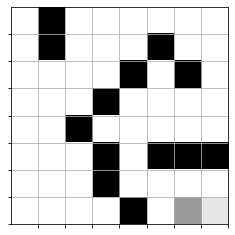

In [52]:
completion_check(model, qmaze)
show(qmaze)

This cell will test your model for one game. It will start the pirate at the top-left corner and run play_game. The agent should find a path from the starting position to the target (treasure). The treasure is located in the bottom-right corner.

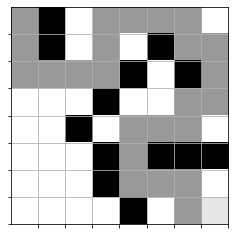

In [53]:
pirate_start = (0, 0)
play_game(model, qmaze, pirate_start)
show(qmaze)

## Save and Submit Your Work
After you have finished creating the code for your notebook, save your work. Make sure that your notebook contains your name in the filename (e.g. Doe_Jane_ProjectTwo.ipynb). This will help your instructor access and grade your work easily. Download a copy of your IPYNB file and submit it to Brightspace. Refer to the Jupyter Notebook in Apporto Tutorial if you need help with these tasks.